<a href="https://colab.research.google.com/github/imyush11/ML-CAPSTONE-PROJECT/blob/main/Bike_Sharing_Demand_Prediction_ML_Regression_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **Bike sharing demand prediction**



##### **Project Type**    - Regression
##### **Contribution**    - Individual
##### **Name** - Imyush Shukla
**Cohort** - Delhi

# **Project Summary -**

The objective of this project is to create a predictive model that can effectively estimate bike rental demand in Seoul, South Korea. This model will leverage historical data on bike usage, weather conditions, and other relevant factors to generate accurate forecasts. The project involves multiple stages including data gathering, data cleaning, feature engineering, model selection, hyperparameter optimization, model training, model assessment, and model deployment.

By accurately forecasting bike rental demand, the project aims to assist Seoul's bike-sharing program in optimizing resource management, enhancing user satisfaction, and minimizing operational costs. Through the application of machine learning and statistical analysis, the project seeks to construct a strong and reliable predictive model that supports data-driven decision-making for the bike-sharing program.

The success of the project will be determined by the model's predictive accuracy regarding bike rental demand, as well as its capacity to offer actionable insights and strategies for enhancing the bike-sharing program's performance. The project holds the potential to not only improve Seoul's bike-sharing operations but also serve as a template for other cities and organizations aiming to enhance their resource allocation and service quality.

## Data Description
The dataset includes weather-related metrics such as temperature, humidity, wind speed, visibility, dew point, solar radiation, snowfall, and rainfall. Additionally, it provides hourly data on the number of bikes rented and includes date information.

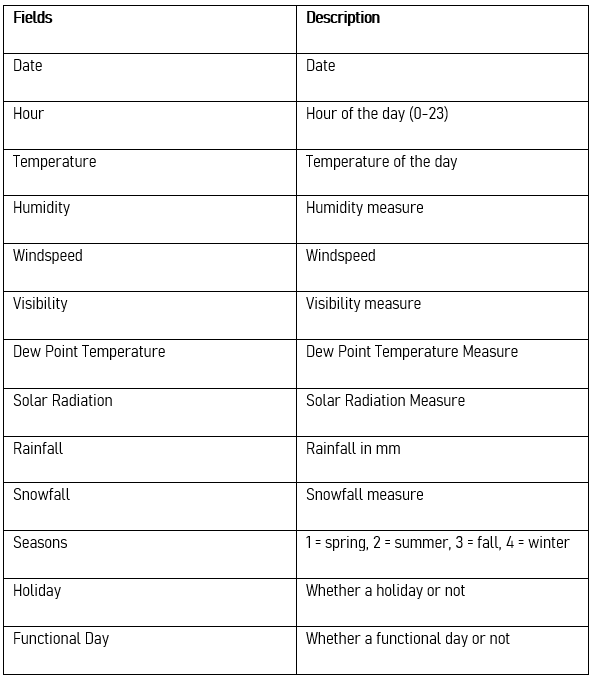

# **GitHub Link -**

GitHub Link - https://github.com/imyush11/ML-CAPSTONE-PROJECT.git

# **Problem Statement**


# The bike-sharing program in Seoul, South Korea, is experiencing low utilization rates and inefficient allocation of resources. The goal of this project is to develop a predictive model that can accurately forecast demand for bike rentals based on historical usage patterns, weather conditions, and other relevant factors. By doing so, we aim to help the bike-sharing program optimize its resources, improve user satisfaction, and reduce operating costs.

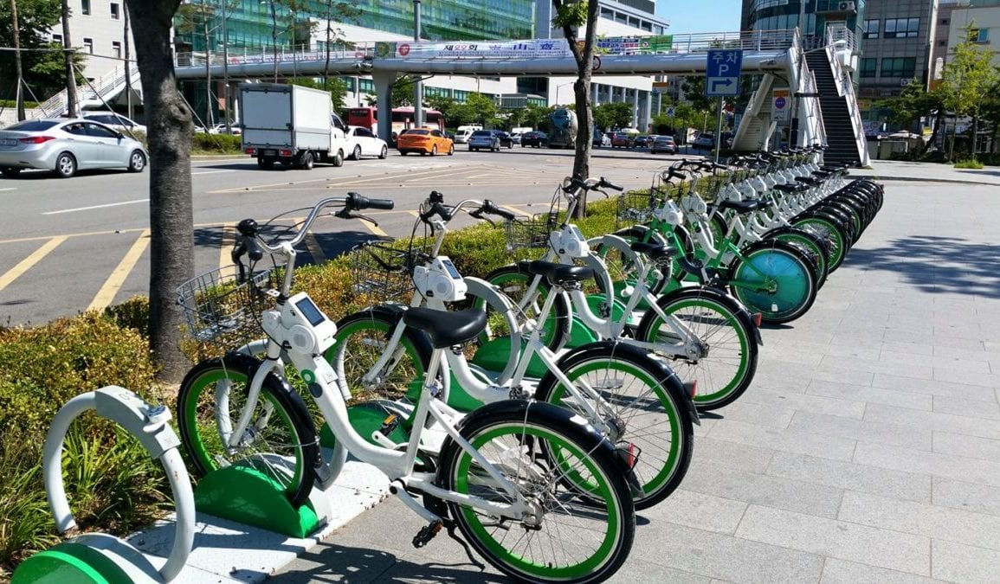

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [541]:
# Importing required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import Ridge, Lasso
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
import datetime as dt
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [542]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [543]:
# Loading Dataset using Github link.
Data = '/content/drive/MyDrive/ML CAPSTONE CAPSTONE/SeoulBikeData.csv'
df = pd.read_csv(Data, encoding= 'unicode_escape')

### Dataset First View

In [544]:
# Dataset First Look (first five rows)
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [545]:
# Dataset Rows & Columns count
print(f'Dataset has {df.shape[0]} rows and {df.shape[1]} columns')

Dataset has 8760 rows and 14 columns


### Dataset Information

In [546]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [547]:
# Dataset Duplicate Value Count
print(f'There are {len(df[df.duplicated()])} duplicate values in dataset.')

# As we can see there are no duplicate values in the Dataset.

There are 0 duplicate values in dataset.


#### Missing Values/Null Values

In [548]:
# Missing Values/Null Values Count
df.isna().sum()

# No Missing Values/Null Values found in dataset.

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

### What did you know about your dataset?

Here is the information rephrased:

1. There are no null or missing values in the dataset, as all values are set to zero.

2. The dataset consists of 14 columns and 8760 rows.

3. The date columns need to be converted to the correct data type.

4. The dataset does not contain any duplicate values.

5. The following columns should be converted to numeric format for modeling purposes:

   - Seasons
   - Holiday
   - Functioning day

## ***2. Understanding Your Variables***

In [549]:
# Dataset Columns
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [550]:
# Dataset Description
df.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,30/11/2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


### Variables Description

Date : year-month-day

Rented Bike count - Count of bikes rented at each hour

Hour - Hour of he day

Temperature-Temperature in Celsius

Humidity - %

Windspeed - m/s

Visibility - 10m

Dew point temperature - Celsius

Solar radiation - MJ/m2

Rainfall - mm

Snowfall - cm

Seasons - Winter, Spring, Summer, Autumn

Holiday - Holiday/No holiday

Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)




### Check Unique Values for each variable.

In [551]:
# Checking Unique Values for each variable
df.nunique()

Date                          365
Rented Bike Count            2166
Hour                           24
Temperature(°C)               546
Humidity(%)                    90
Wind speed (m/s)               65
Visibility (10m)             1789
Dew point temperature(°C)     556
Solar Radiation (MJ/m2)       345
Rainfall(mm)                   61
Snowfall (cm)                  51
Seasons                         4
Holiday                         2
Functioning Day                 2
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

In [552]:
# Writing the code to make the dataset analysis ready.

In [553]:
# We can see that the Date variable is in object datatype, we need to change it into datetime datatype
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Extract month and day name
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day_name()



In [554]:
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,month,day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday


In [555]:
# Dropping Date variable from dataset
df.drop(['Date'],axis = 1, inplace = True)

In [556]:
# Defining separate data as numerical and categorical data.

# Numerical data

numerical_data = list(set(df.describe().columns.tolist()))

# Categorical data

categorical_data = list(set(df.columns)-set(numerical_data))


### What all manipulations have you done and insights you found?

1. Converted the 'Date' column from an object data type to the DateTime data type.

2. Generated new columns 'Day' and 'Month' from the 'Date' column, then removed the original 'Date' column.

3. Created Categorical and Numerical Data




## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1
# Visualizing data distribution of our dependent variable (Rented Bike Count)

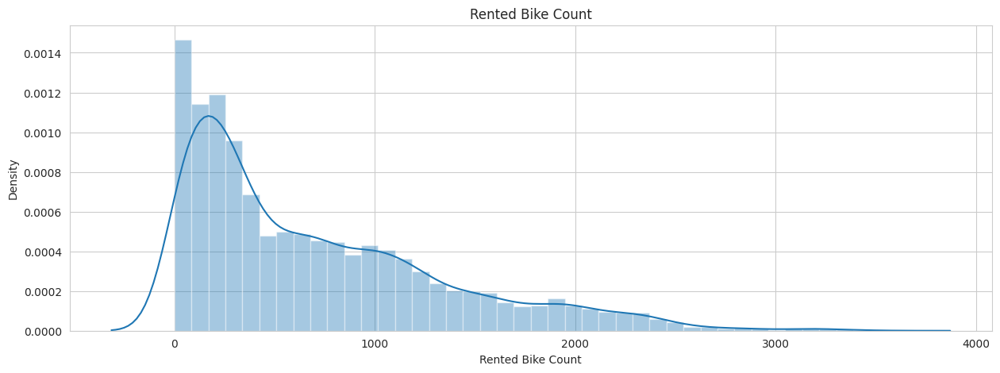

In [557]:
# Chart - 1 visualization code

plt.figure(figsize=(15,5))
plt.title('Rented Bike Count')
sns.distplot(df['Rented Bike Count'] )
plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Data is positively skewed may need to transform it further.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

As of now we know that the data is positively skewed that means the bike demand for smaller bulks is more.

#### Chart - 2
# Visualizing data distribution of categorical data with respect to Rented Bike Count.

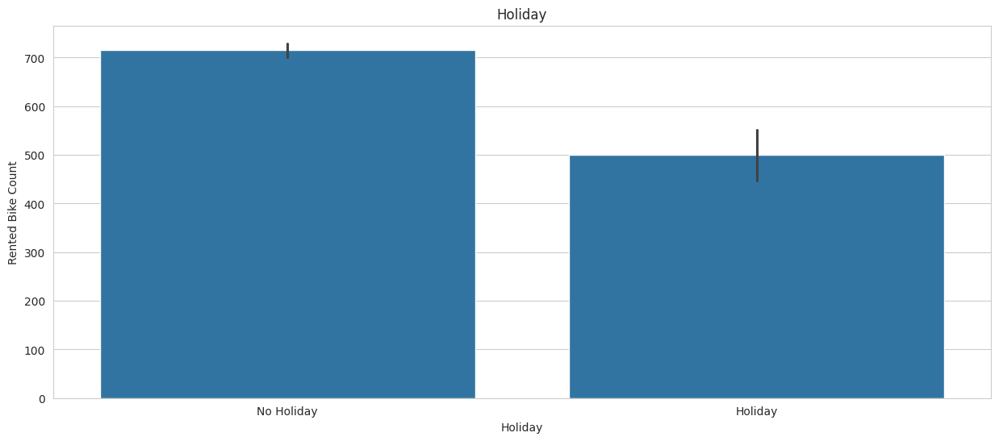

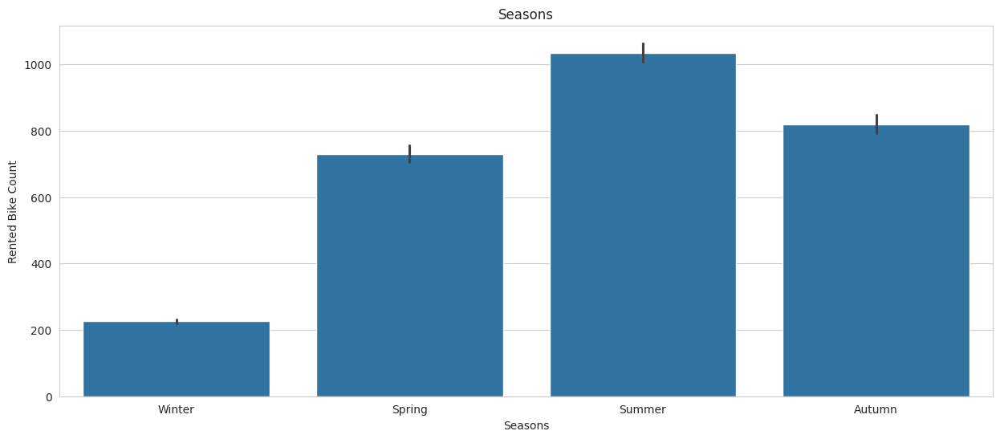

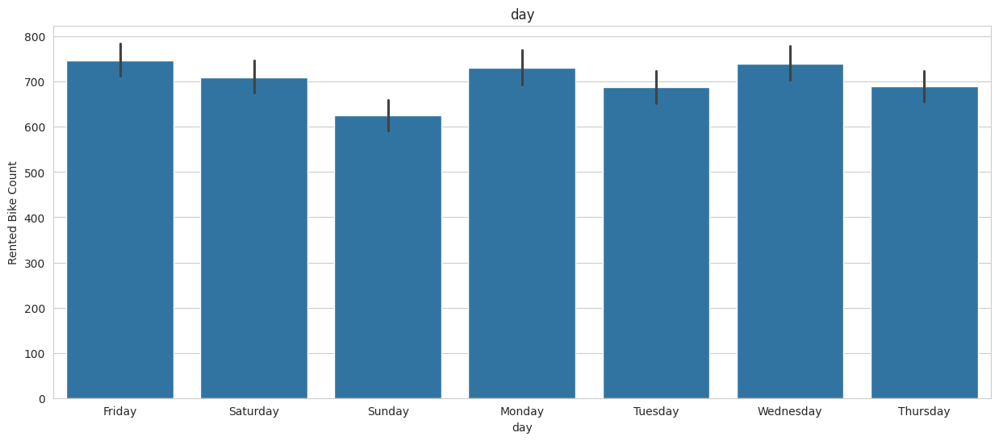

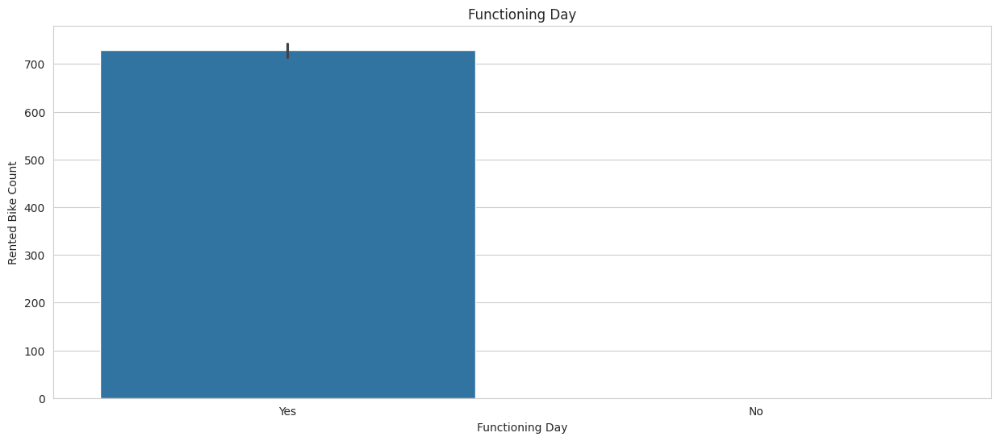

In [558]:
# Chart - 2 visualization code

# Creating a for loop for visualizing all the categorical data with respect to Rented Bike Count.

for i in categorical_data:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.barplot(x = df[i], y = df['Rented Bike Count'])
    plt.show()

##### 1. Why did you pick the specific chart?

To visualise and spread categorical data with respect to Rented Bike Count.

##### 2. What is/are the insight(s) found from the chart?

1. The busiest time for bike rentals is from 5:00 PM to 7:00 PM, while the least busy period for rentals is between 3:00 AM and 5:00 AM.

2. The month with the highest number of bike rentals is June, and the month with the lowest is January.

3. Thursdays have the highest number of bikes rented, while Sundays see the fewest rentals.

4. Bike rentals are most popular during the summer season and least popular during the winter.

5. More bikes are rented on non-holidays compared to holidays.

6. No bikes were rented on non-operational days, resulting in 295 instances of "NO." These values and columns containing only "Yes" data are not useful and will be removed in future steps.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how time, month, day, season and holiday impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 3
#Bike Rent Count trend with respect to Hours on Months.

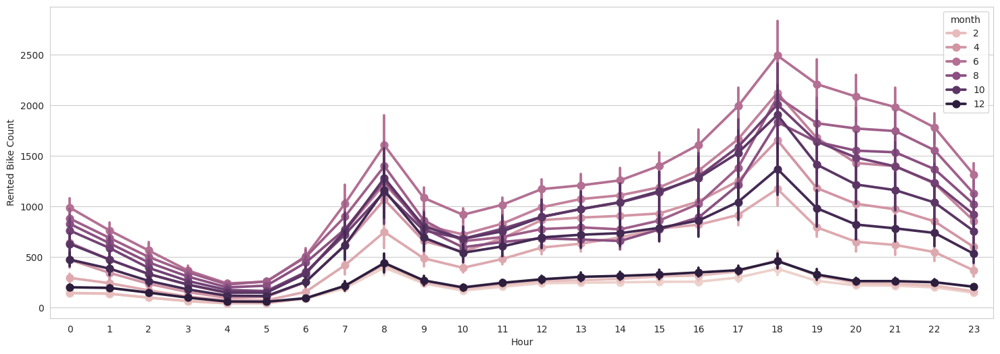

In [559]:
# Chart - 3 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,6))
sns.pointplot(x = df['Hour'], y = df['Rented Bike Count'], hue = df['month'])
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Months

##### 2. What is/are the insight(s) found from the chart?

June is the peak and February is the bottom month for number of rented bikes.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights obtained have the potential to significantly benefit the business. By understanding how different months influence the number of rented bikes, we can develop targeted strategies.

#### Chart - 4
# Bike Rent Count trend with respect Hours on Seasons.

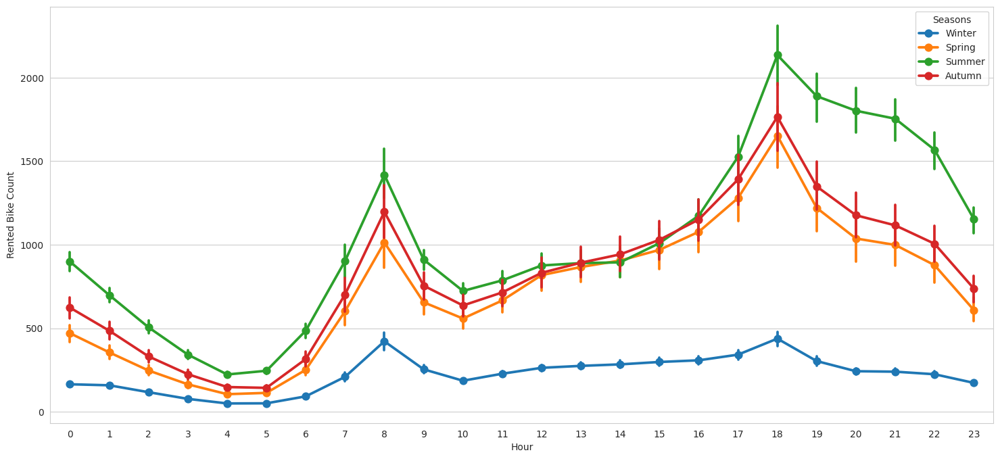

In [560]:
# Chart - 4 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = df['Hour'], y = df['Rented Bike Count'], hue = df['Seasons'])
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Months

##### 2. What is/are the insight(s) found from the chart?

People prefer renting bikes most in the Summer season and the least in winter season.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Seasons impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 5
# Bike Rent Count trend with respect Hours on Days.

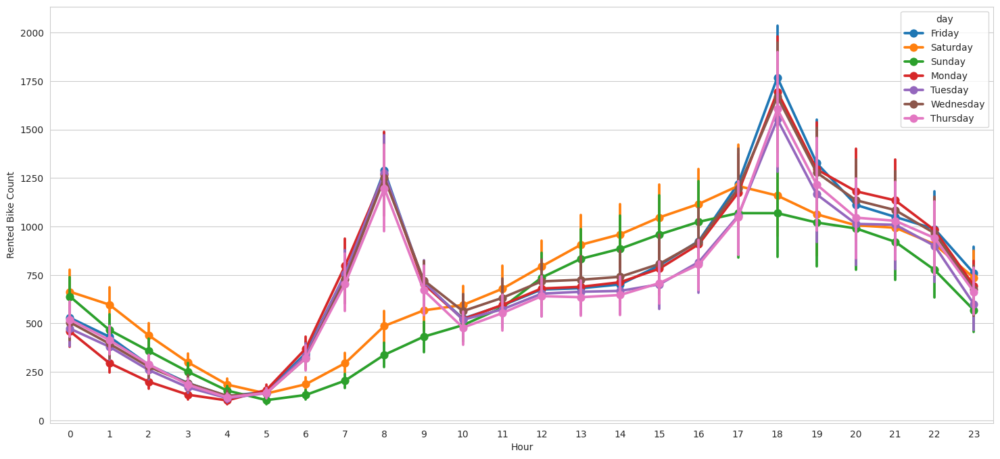

In [561]:
# Chart - 5 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = df['Hour'], y = df['Rented Bike Count'], hue = df['day'])
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Day.

##### 2. What is/are the insight(s) found from the chart?

Highest no. of bikes are booked on Thursday and the least on Sunday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Days impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 6
# Bike Rent Count trend with respect Hours on Holidays.

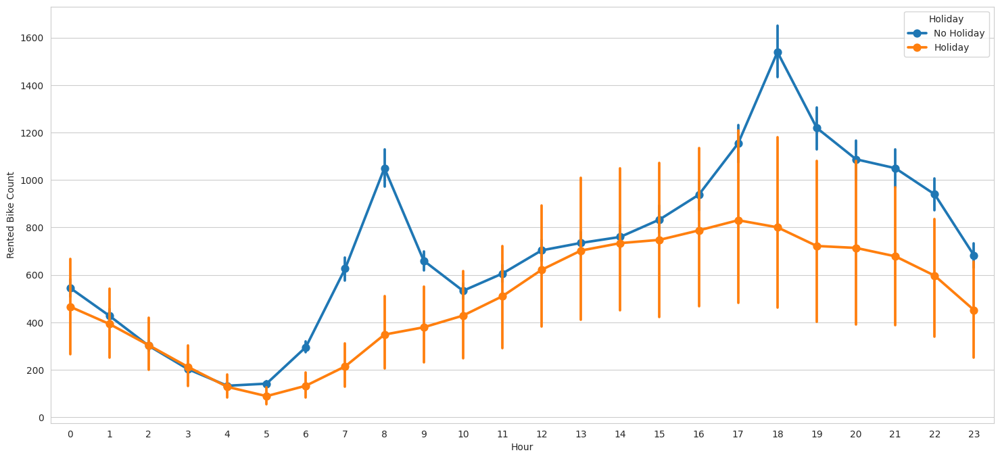

In [562]:
# Chart - 6 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = df['Hour'], y = df['Rented Bike Count'], hue = df['Holiday'])

plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Holiday.

##### 2. What is/are the insight(s) found from the chart?

People rented more bikes on a non-holiday compared to a holiday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Holidays impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 7
# visualizing outliers using box plot of numeric columns.

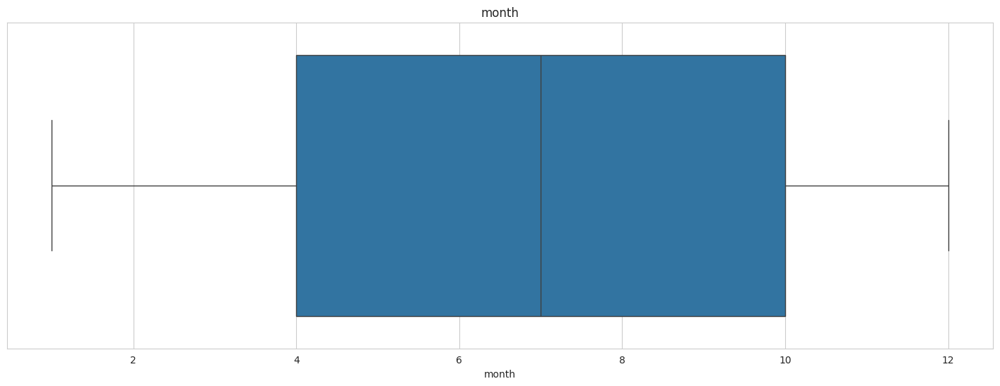

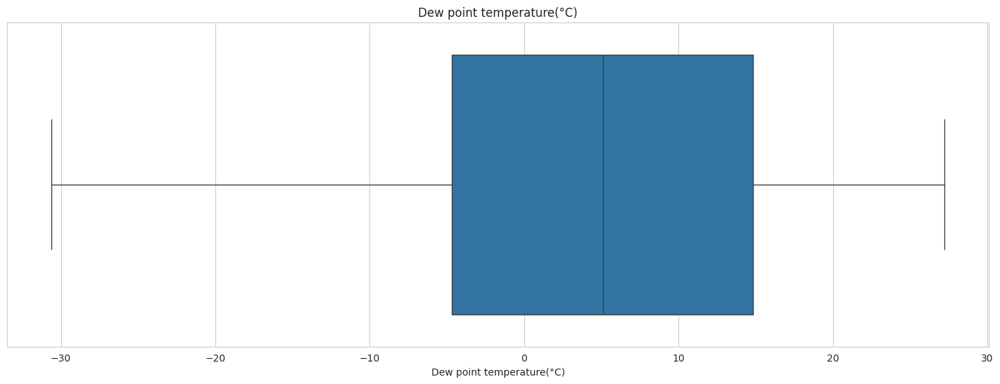

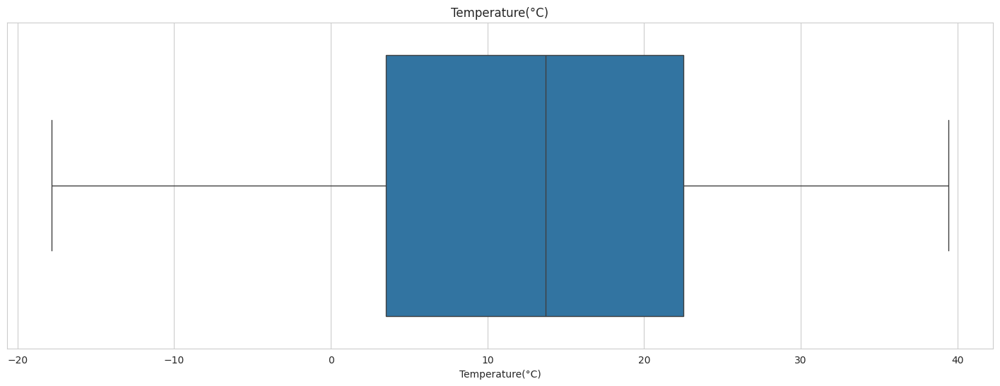

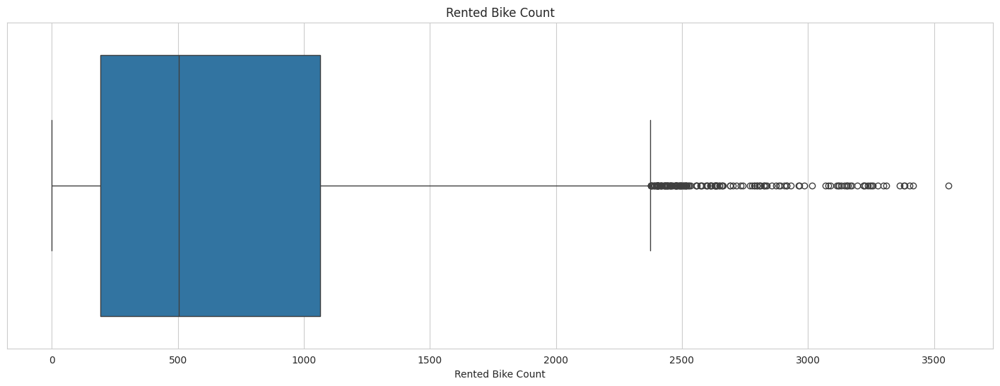

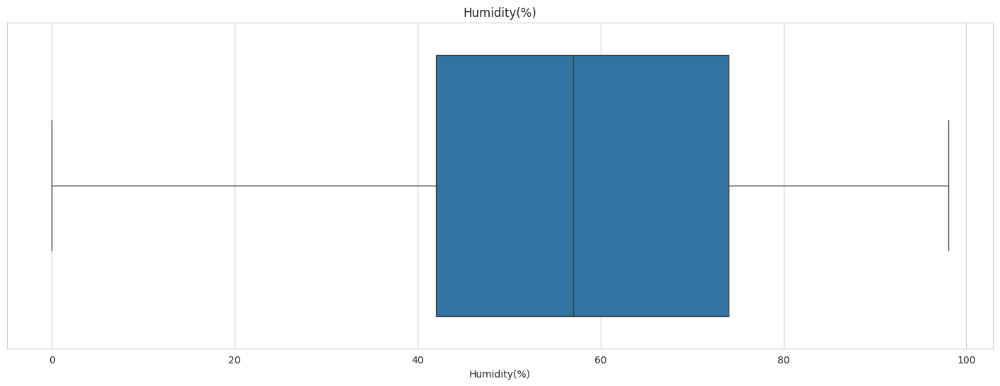

...

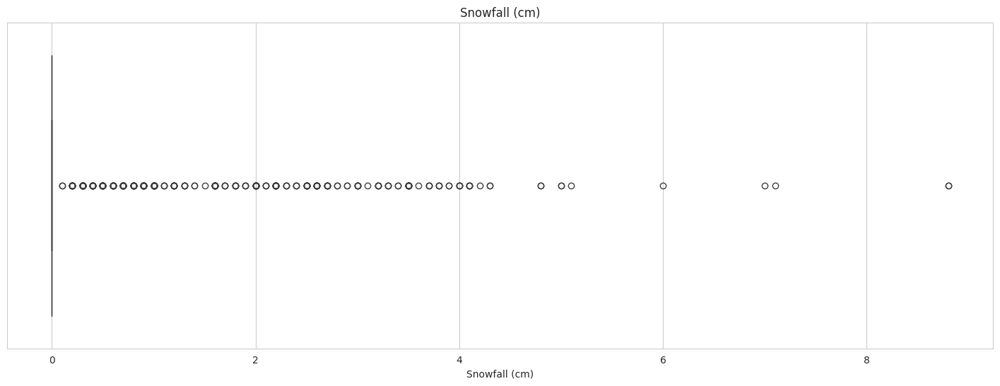

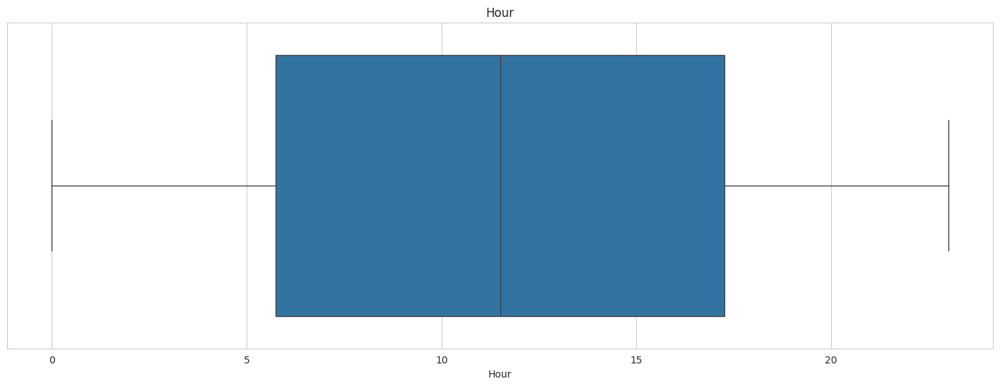

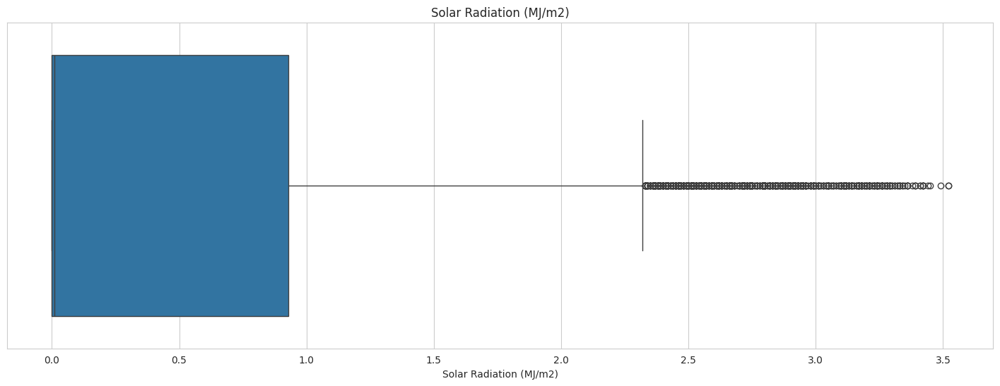

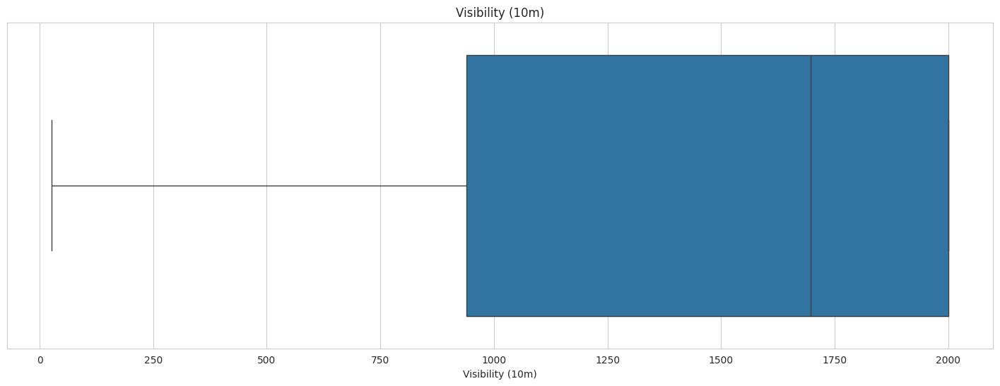

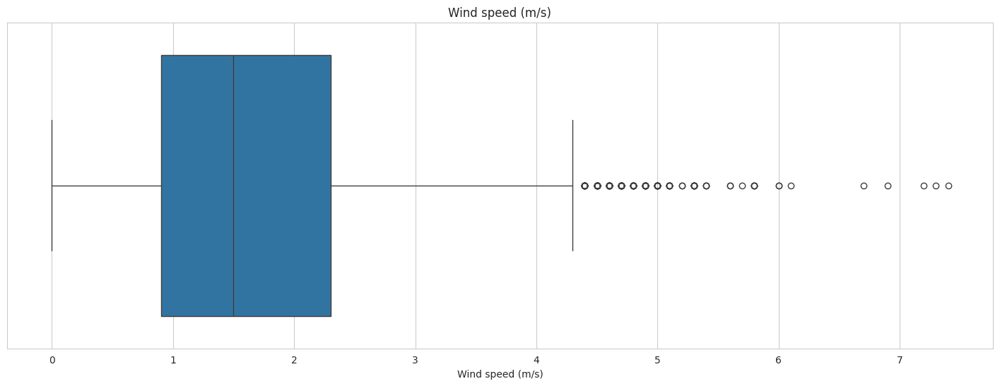

In [563]:
# Chart - 7 visualization code

# Writing code for creating a for loop for numerical variables and creting box plots.

for i in numerical_data:
  plt.figure(figsize = (18,6))
  sns.boxplot(x = df[i])
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Using Boxplots as we need to identify outliers.

##### 2. What is/are the insight(s) found from the chart?

Rainfall, Solar Radiation, Snowfall and Windspeed has high numbers of outliers.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Outliers can sometimes signal potential avenues for business expansion. For instance, if a few customers are renting bikes at a much higher rate compared to the average customer, they might form a niche market segment. This group could be targeted with tailored promotions or marketing strategies.

#### Chart - 8
# Lets check the linear relationship between the dependent variable-"Rented Bike Count' and remaining columns(independent variables).

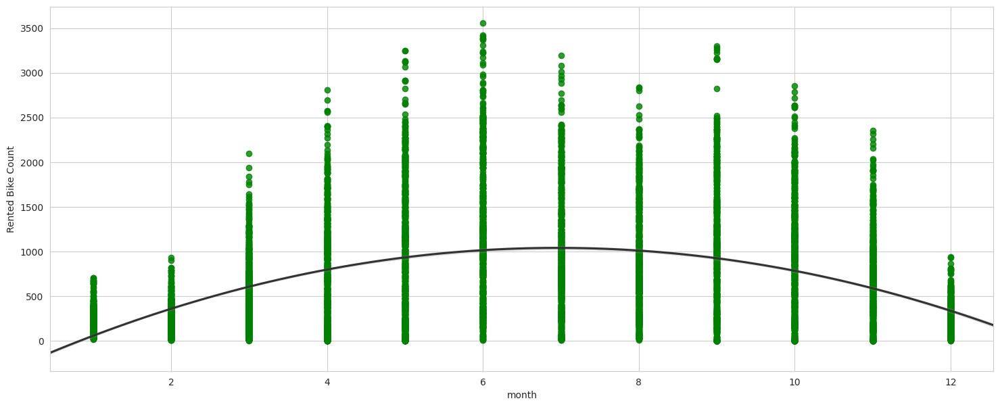

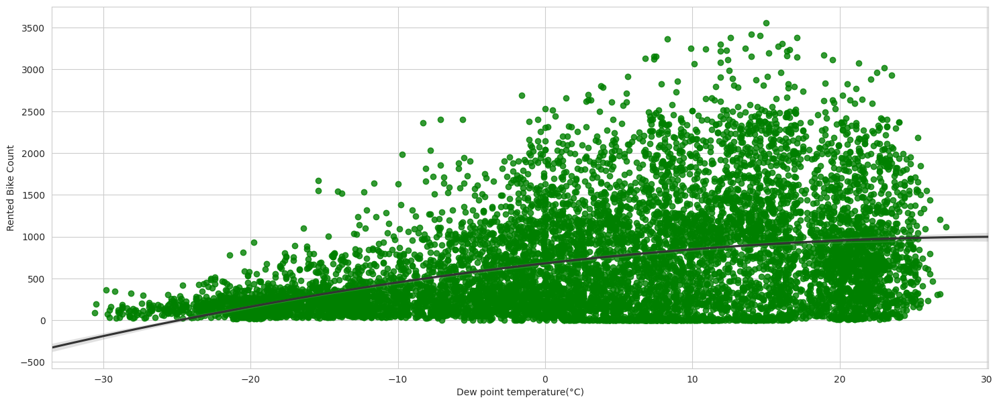

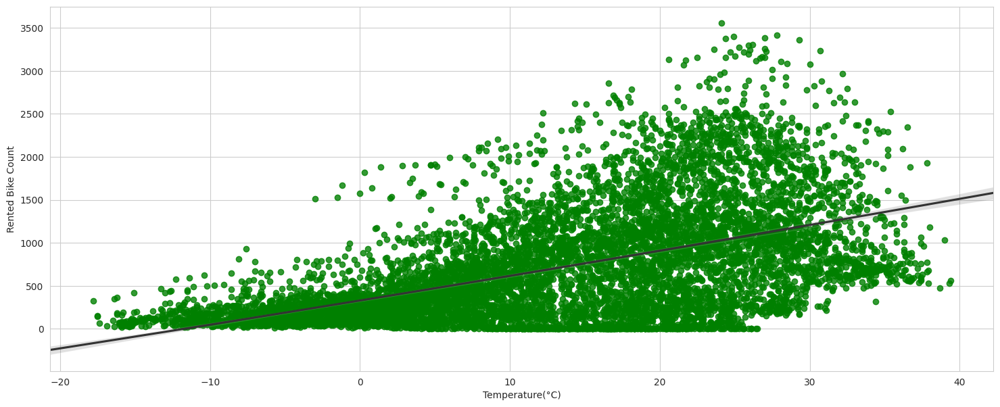

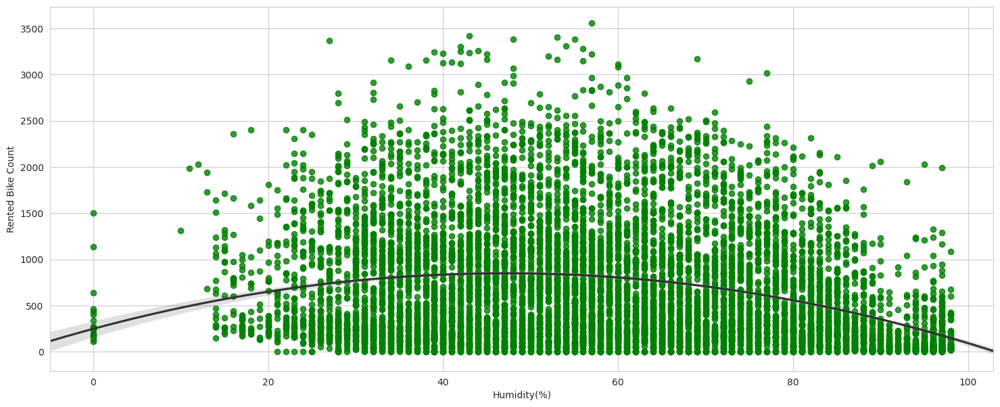

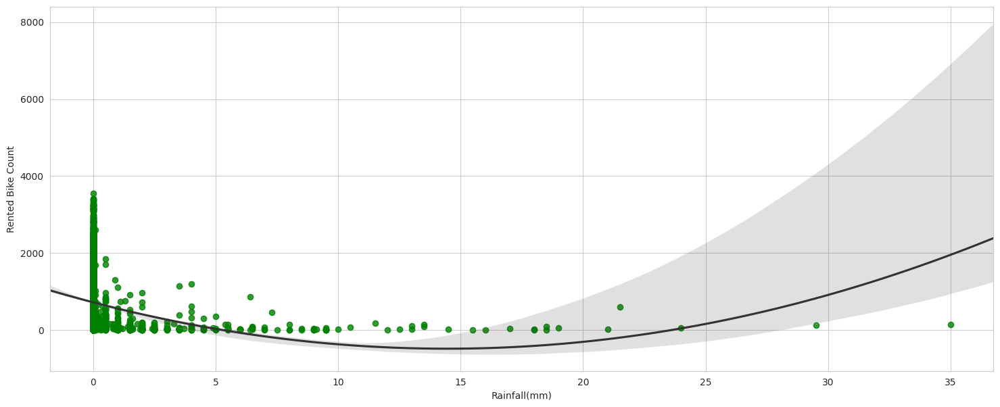

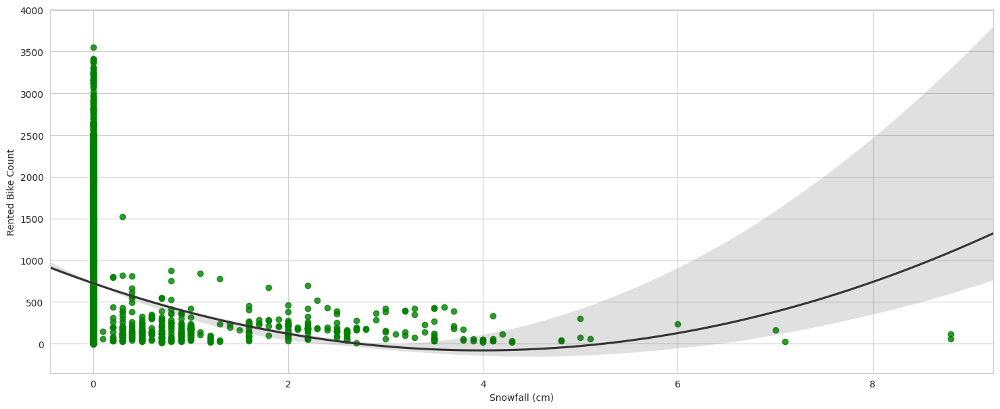

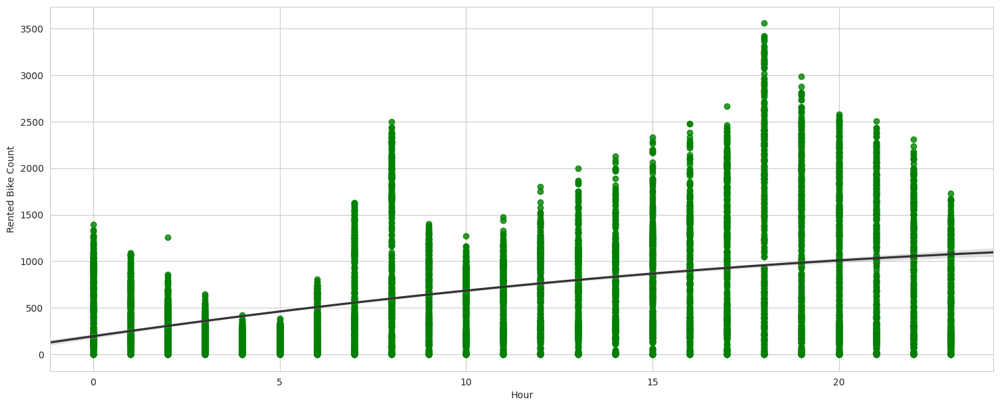

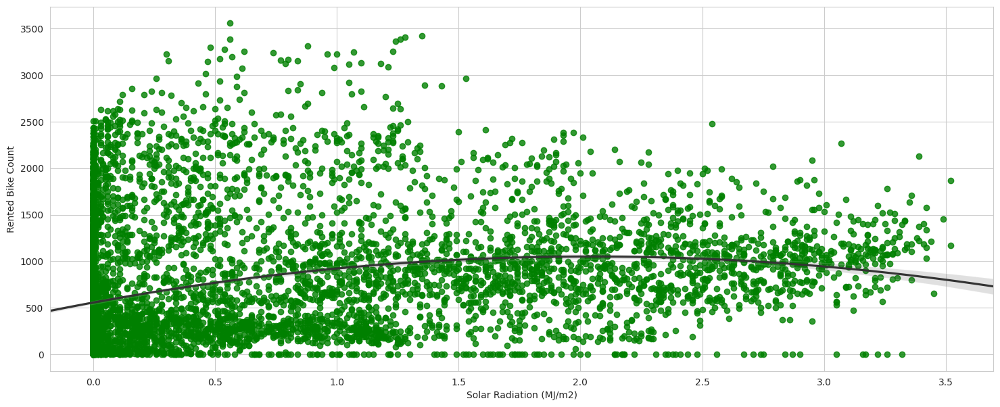

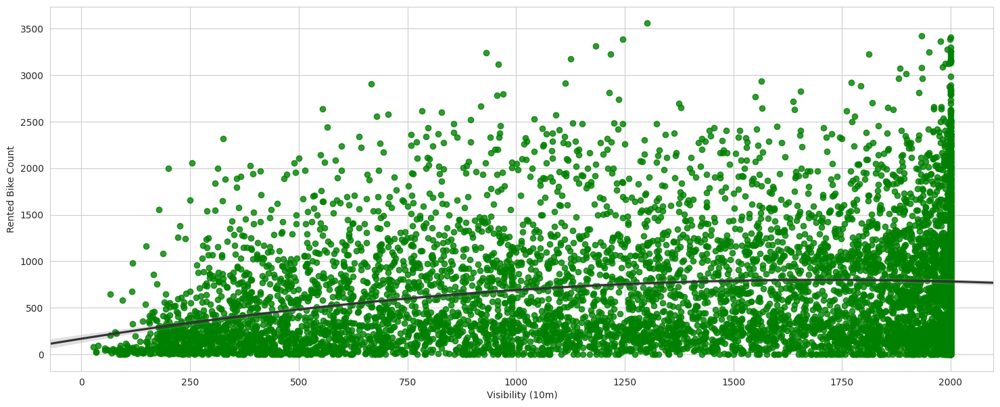

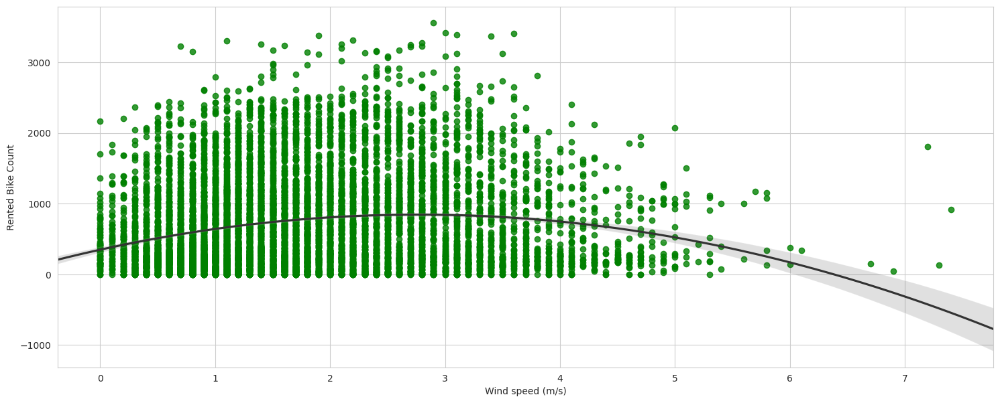

In [564]:
# Chart - 8 visualization code using regplot.
for i in numerical_data:
  if i not in ['Rented Bike Count']:
    fig = plt.figure(figsize = (18,7))
    fig = plt.gca()

    sns.regplot(
        data=df, x=i, y="Rented Bike Count",
        truncate=False, order=2, color=".2",scatter_kws={'color':'green'}
    )
    plt.show()

##### 1. Why did you pick the specific chart?

I employed a regplot to efficiently illustrate the relationship between two variables and assess whether it follows a linear or non-linear pattern.

##### 2. What is/are the insight(s) found from the chart?

Hourly Trends:
1. A significant peak in bike rental counts occurs between 6/7 AM and 10 AM, likely due to individuals commuting to work or school.
2. Another peak in bike rentals can be seen between 10 AM and 7 PM, which may coincide with people leaving work or school.
3. Overall, bike rentals remain high from 7 AM to 7 PM, but begin to decrease from 7 PM to 7 AM.

Temperature:
1. When the temperature falls below 0°C, bike rental counts drop considerably, possibly because people prefer not to ride in such cold weather.
2. In moderate temperatures, bike rental counts are high, suggesting favorable conditions for biking.

Humidity:
1. There appears to be an inverse relationship between humidity and bike rental counts; as humidity levels rise, bike rentals decline.

Wind Speed:
1. Wind speeds of up to 4 m/s are associated with a good volume of bike rentals.

Visibility:
1. As visibility improves, so do bike rental counts, as better visibility likely encourages biking.

Dew Point Temperature:
1. The trend with dew point temperature mirrors that of regular temperature; when dew point temperature falls below 0°C, bike rentals decrease. Dew point and regular temperature seem closely related.

Solar Radiation:
1. A large number of bikes are rented when there is solar radiation, suggesting favorable weather conditions for biking.

Rainfall and Snowfall:
1. It's clear that people generally avoid riding bikes in rainy or snowy conditions.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights we've gathered can significantly contribute to a positive business outcome by revealing how various factors influence bike rental numbers. This knowledge allows us to develop targeted strategies based on these relationships.

#### Chart - 9

# Visualizing the data distribution on the dependent variable before normalization.



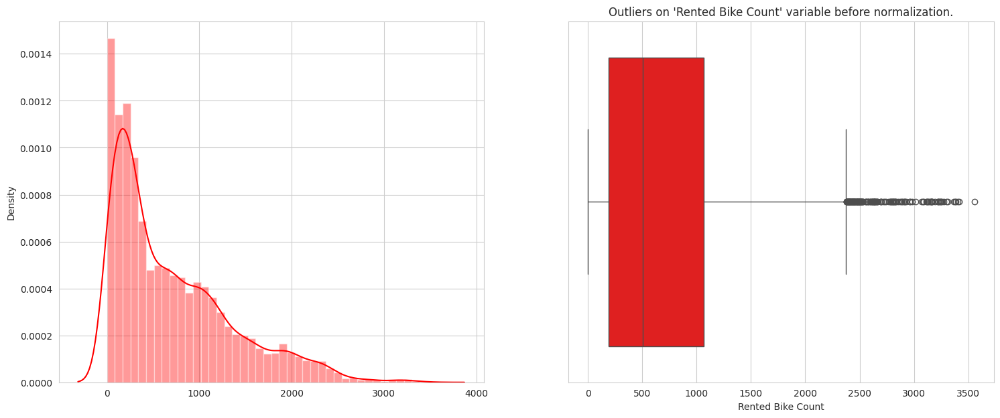

In [565]:
# Chart - 9 visualization code

# Visualizing the data distribution on the dependent variable using distplot and boxplot charts.

f, axes = plt.subplots(1, 2,figsize=(18,7))
sns.distplot(x=(df['Rented Bike Count']),color='r',ax=axes[0])
sns.boxplot(x=(df['Rented Bike Count']),color='r',ax=axes[1])
plt.title("Outliers on 'Rented Bike Count' variable before normalization.")
plt.show()

#### Chart - 10

# Visualizing the data distribution on the dependent variable after normalization.

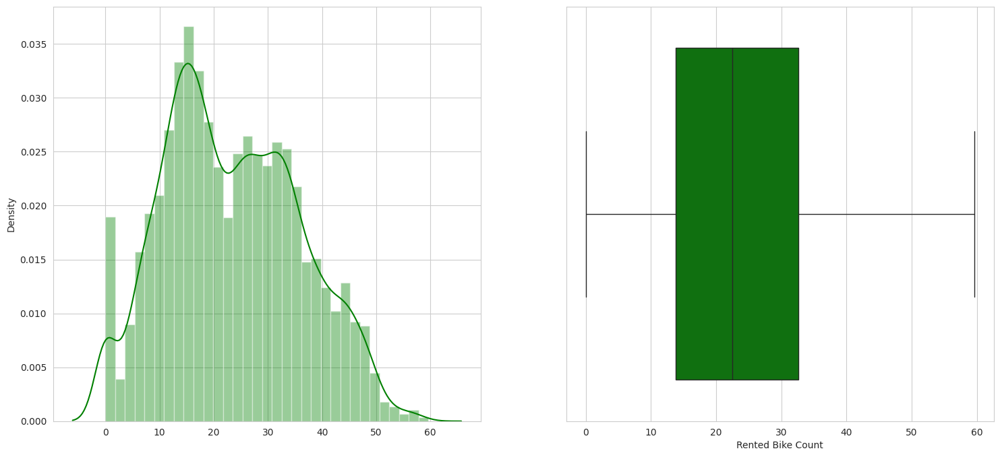

In [566]:
# Chart - 10 visualization code

# Normalizing  our target variable by squre root method

f, axes = plt.subplots(1, 2,figsize=(18,8))
sns.distplot(x=np.sqrt(df['Rented Bike Count']),color='g',ax=axes[0])
sns.boxplot(x=np.sqrt(df['Rented Bike Count']),color='g',ax=axes[1])
plt.show()

##### 1. Why did you pick the specific chart?

Used distplot to visualize the distribution of data and using boxplot to detect outliers.

##### 2. What is/are the insight(s) found from the chart?

As we can see from both the charts the distribution of the data is less skewed and is moving towards normally distributed data

The outliers are also gone after normalization.





##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.

#### Chart - 11

# Visualizing data distribution of numerical data.

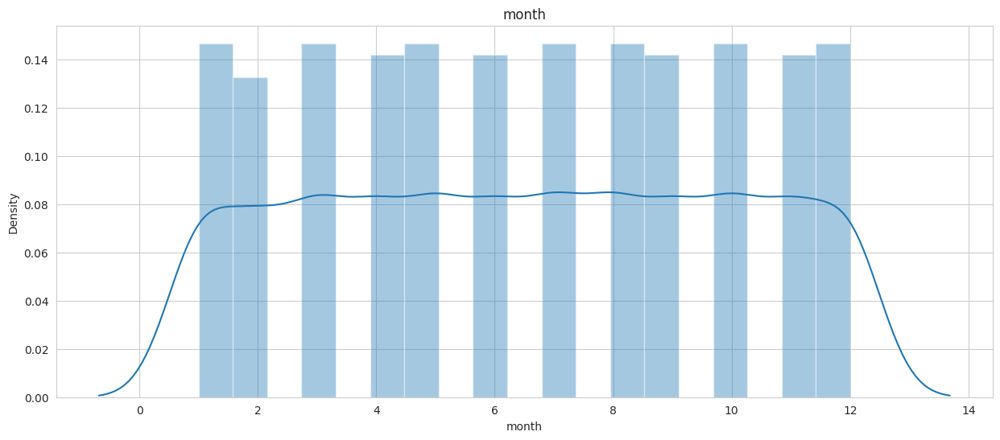

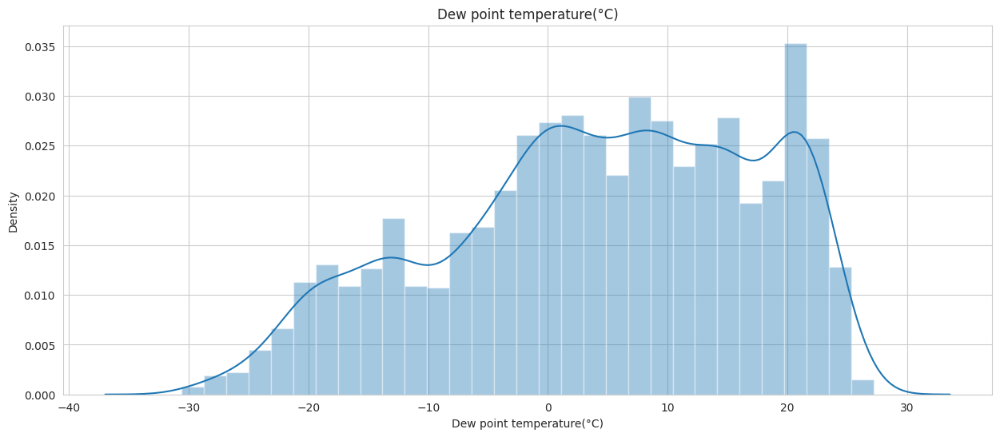

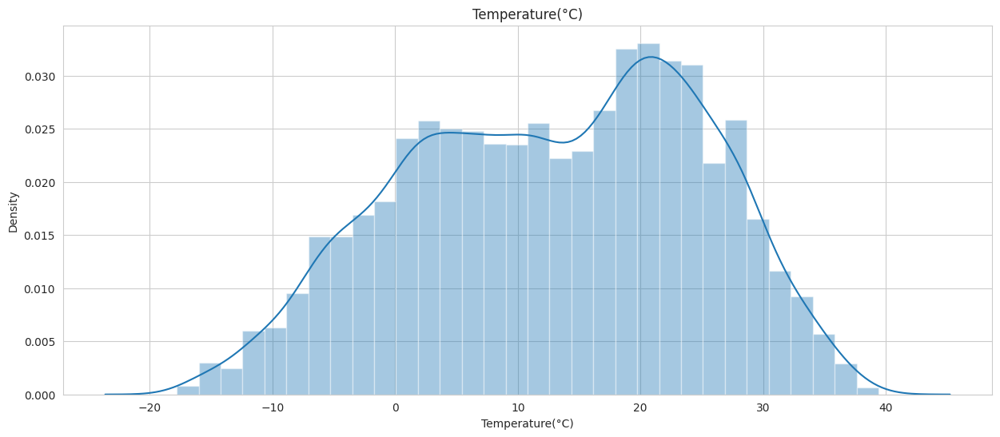

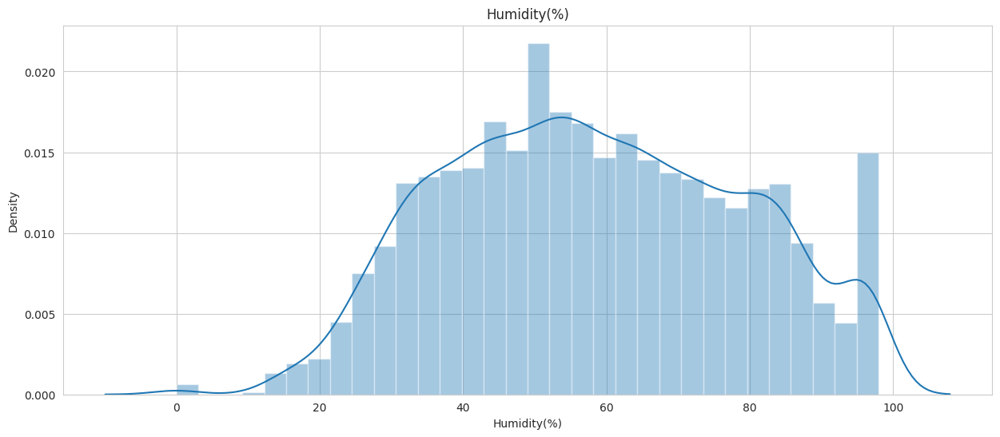

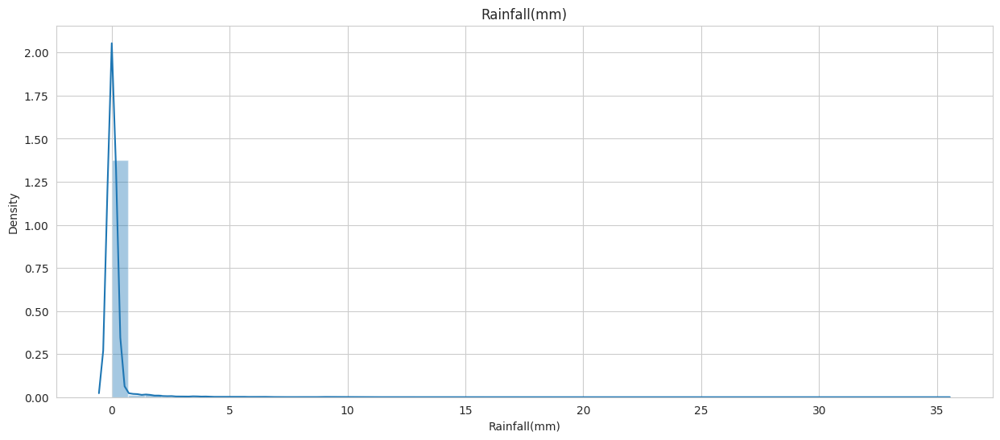

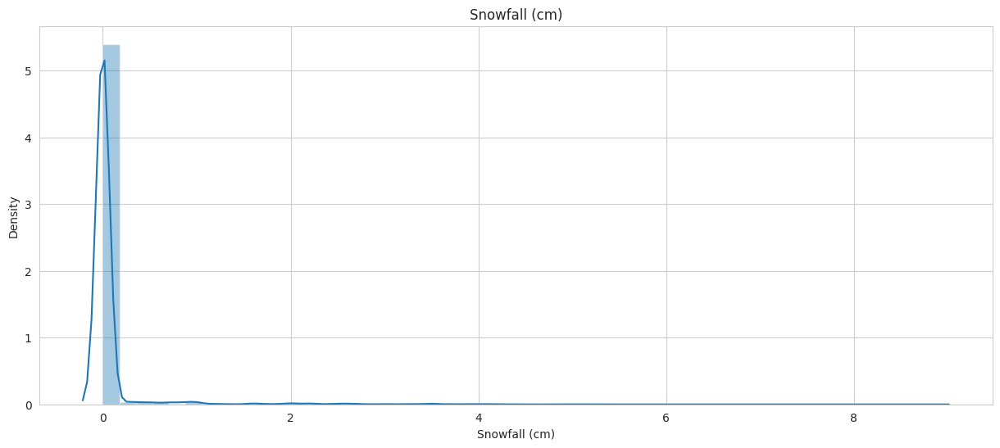

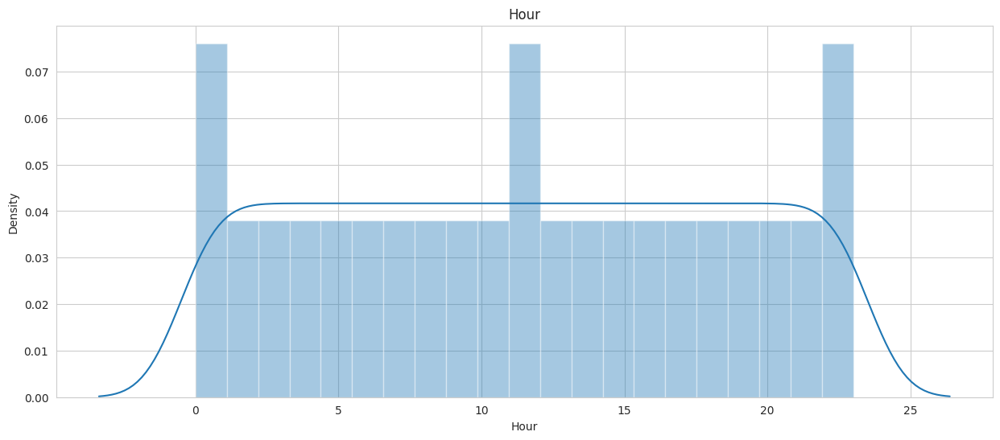

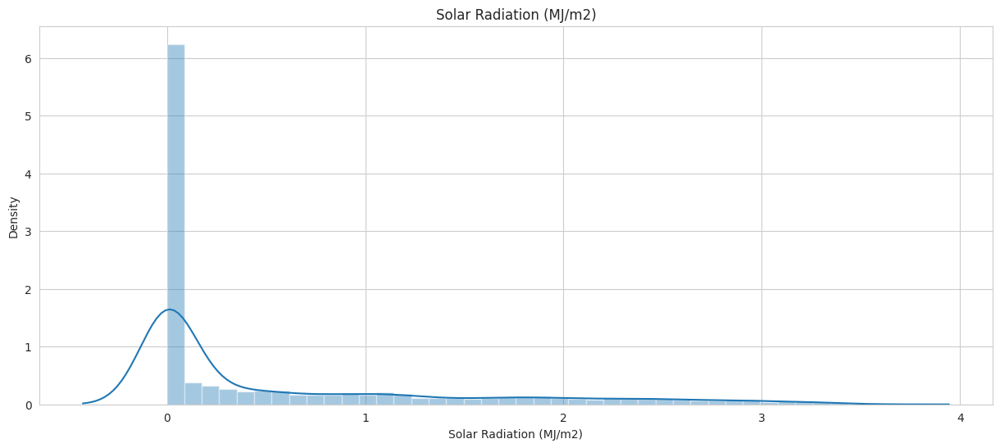

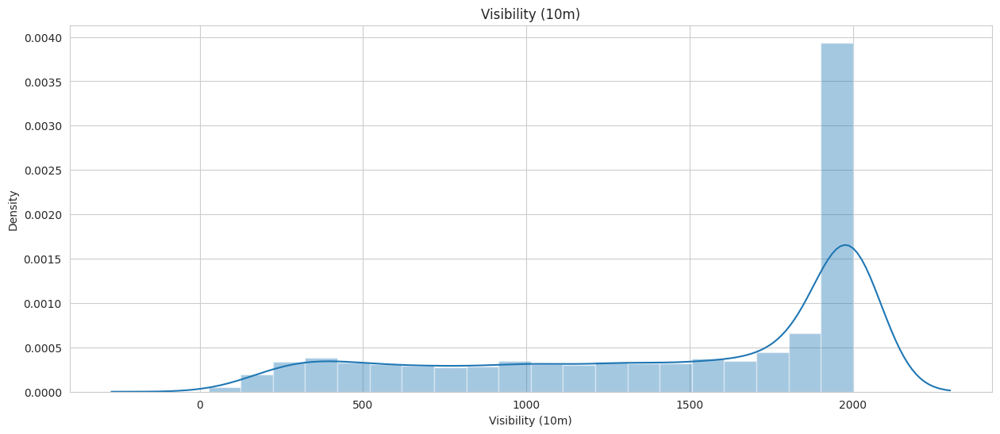

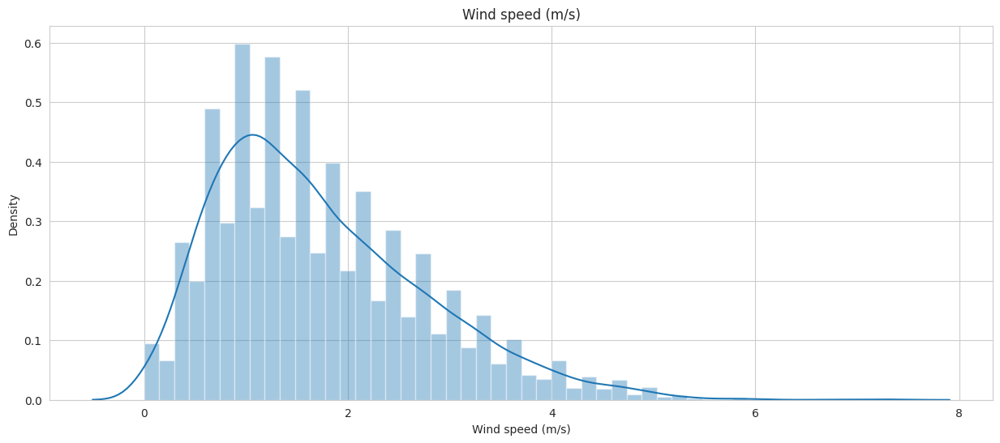

In [567]:
#Chart - 11

# Creating a for loop for visualizing all the numerical variables using distplot.

for i in numerical_data:
  if i not in ['Rented Bike Count']:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.distplot(df[i] )
    plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?


Solar radiation, Snowfall, Rainfall and visibility are highly skewed.





##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

It is evident that weather significantly affects biking patterns since data for solar radiation, snowfall, rainfall, and visibility shows notable skewness. This suggests that people prefer riding a bike when weather conditions are favorable.


#### Chart - 12

# Visualizing the numerical after square root normalization.

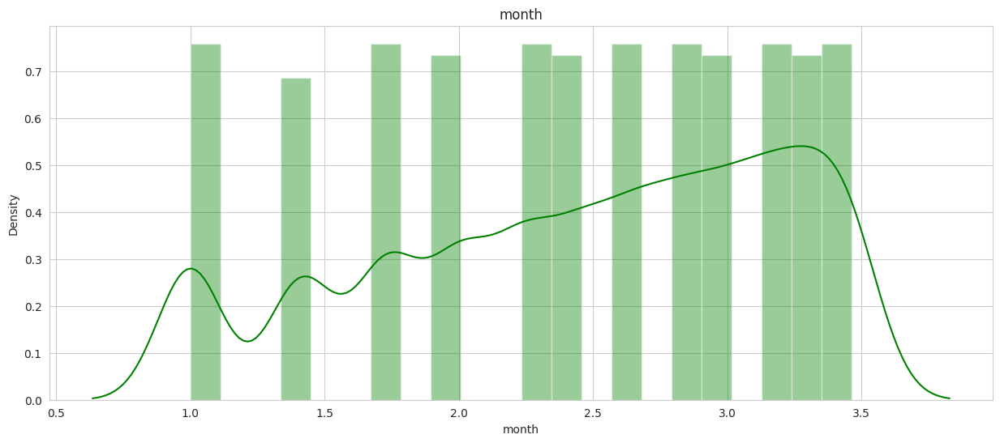

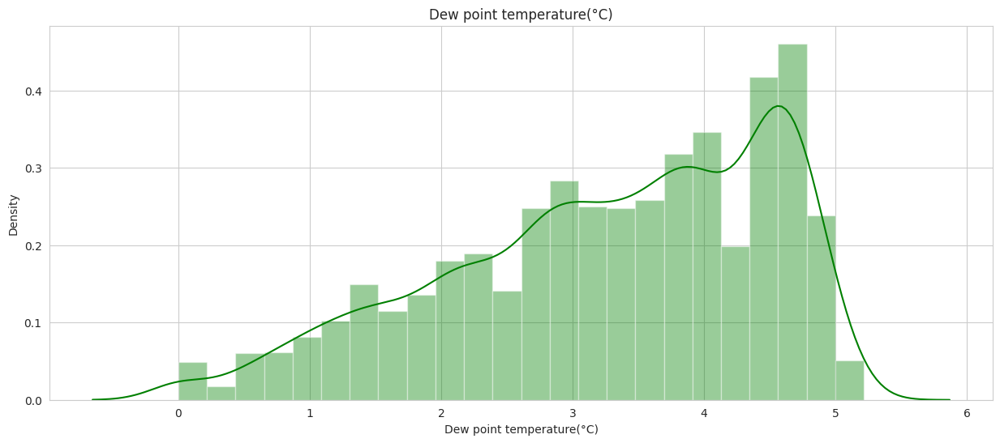

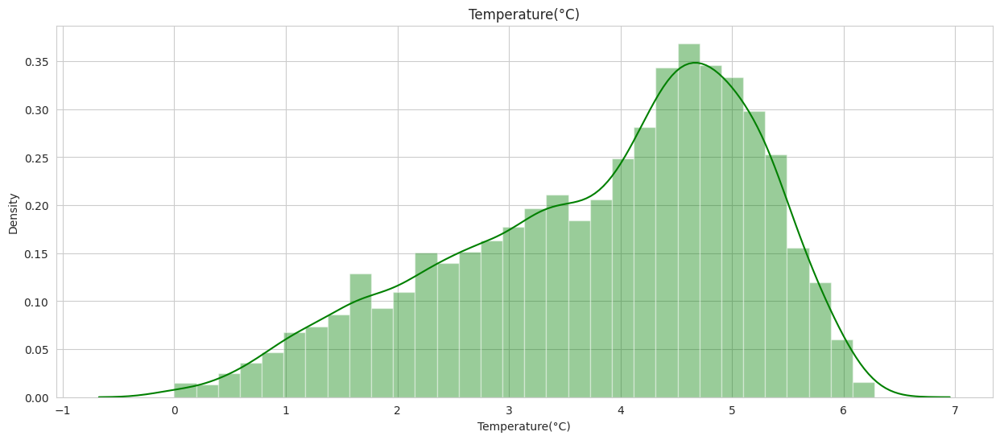

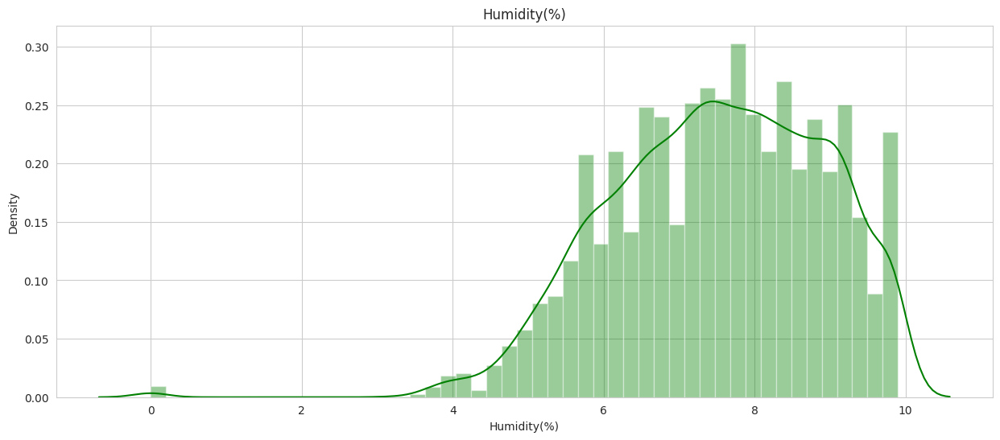

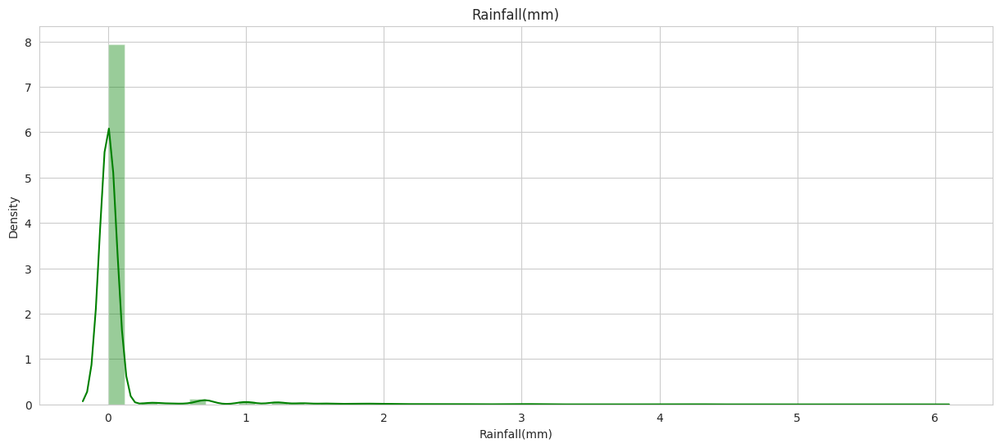

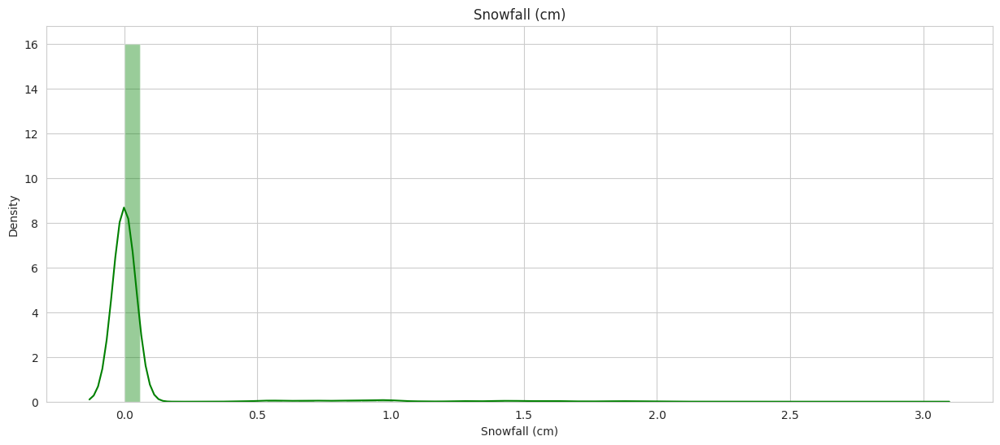

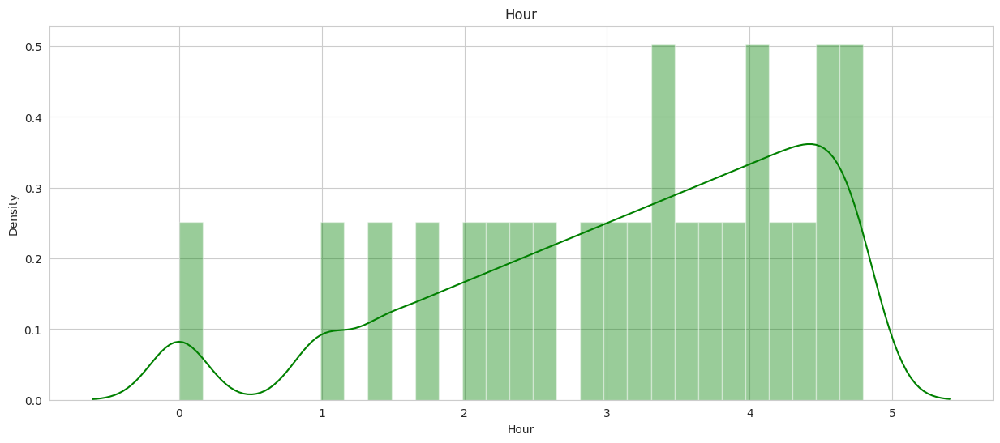

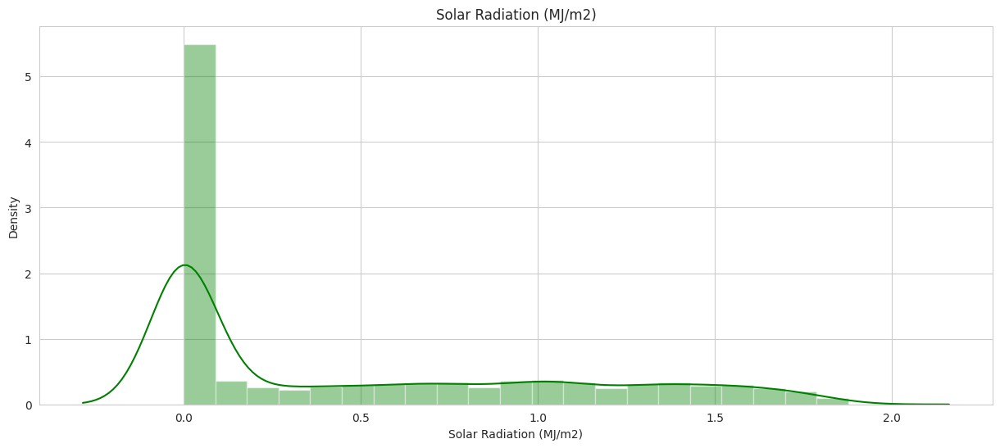

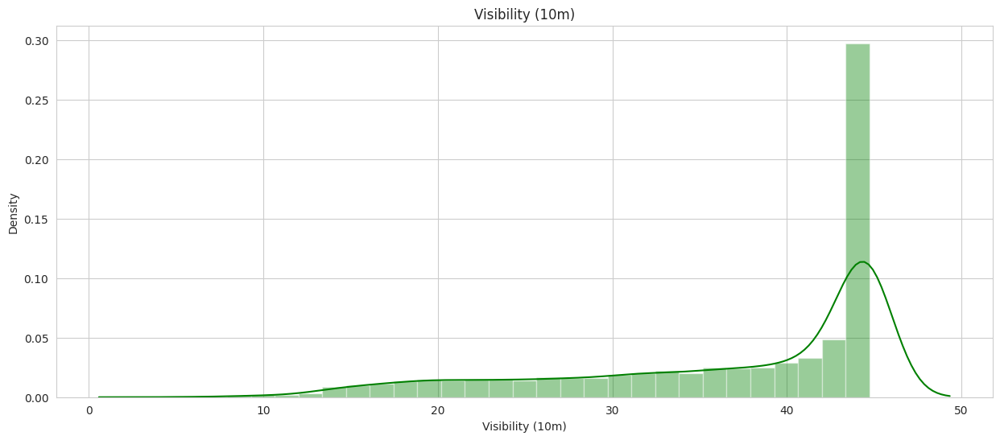

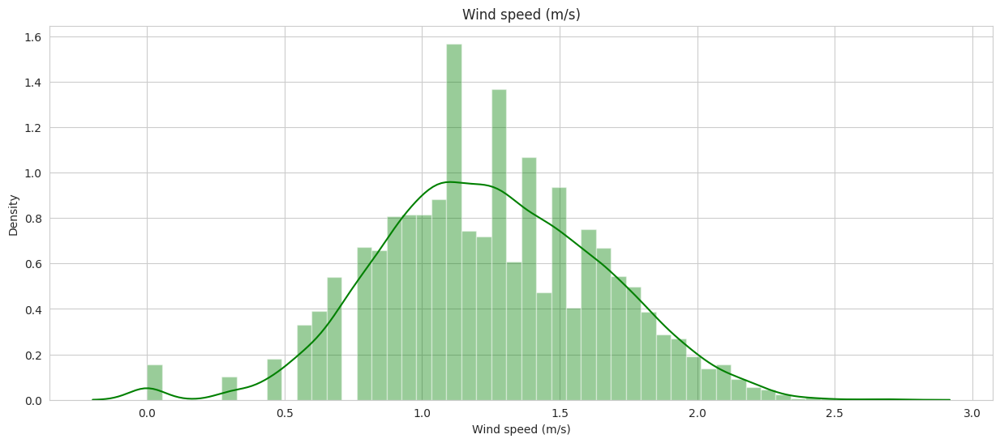

In [568]:
# Chart - 12 visualization code with distplot after normalising.
for i in numerical_data:
  if i not in ['Rented Bike Count']:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.distplot(np.sqrt(df[i]), color = 'g' )
    plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Distribution of Wind speed, Dew point temperature, Temperature and Humidity has improved.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.


#### Chart - 13
# Checking distribution of numerical data with mean and median after normalization.

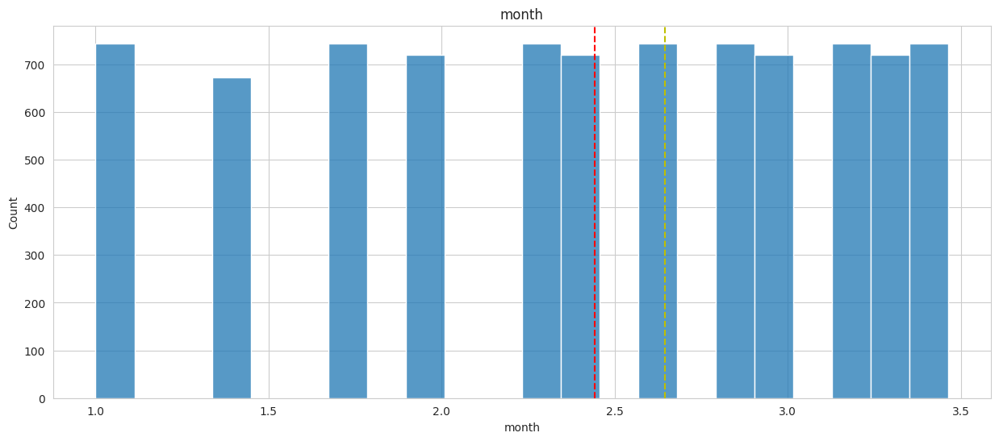

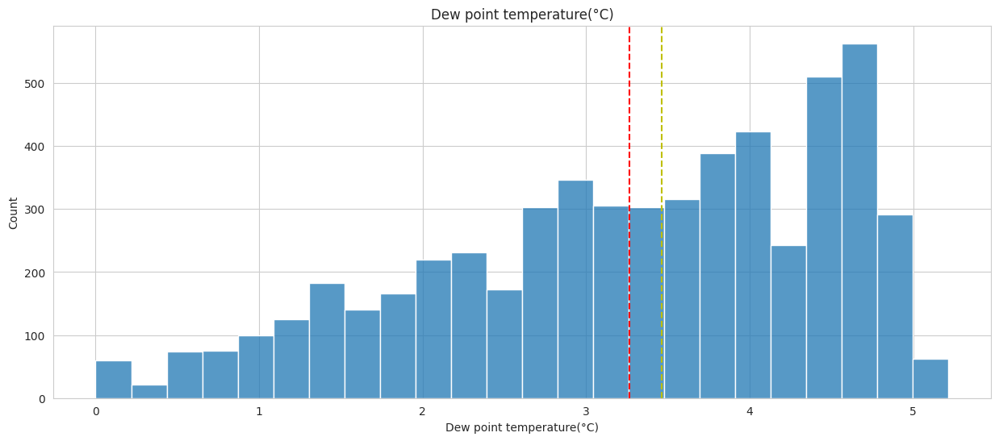

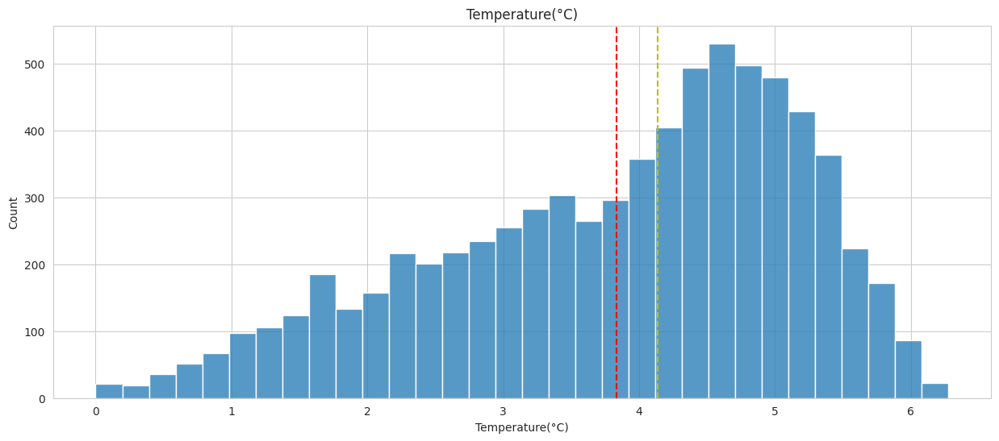

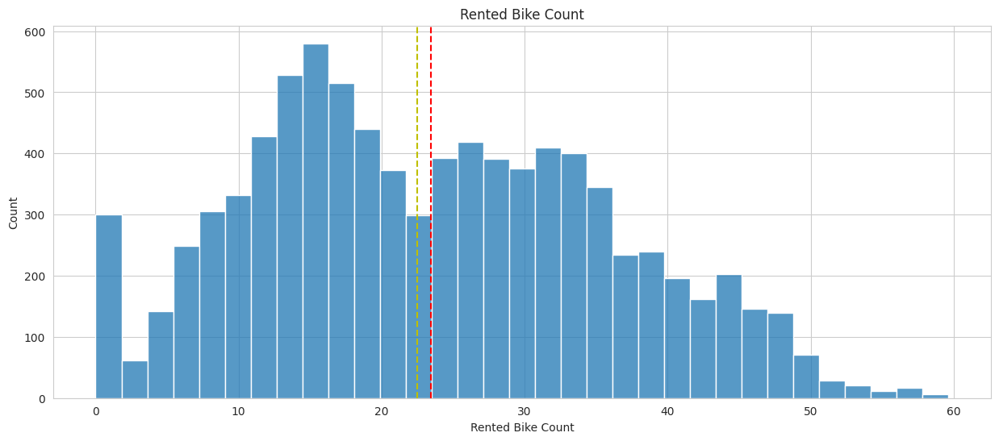

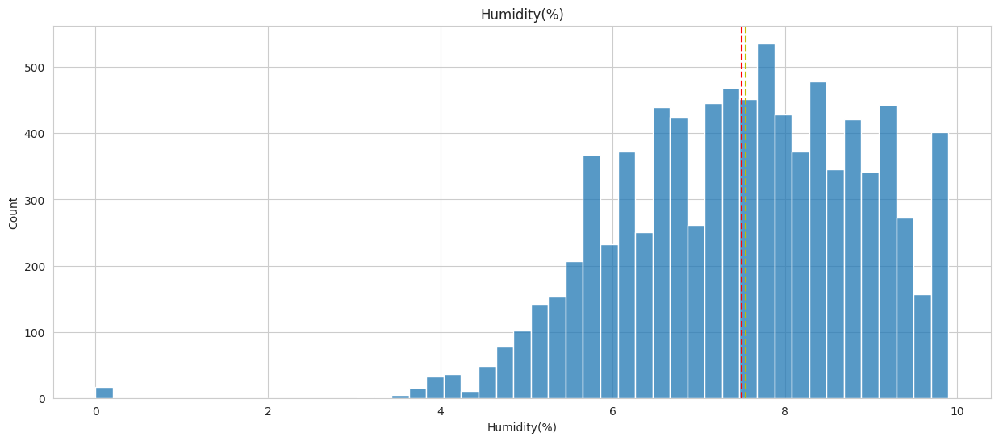

...

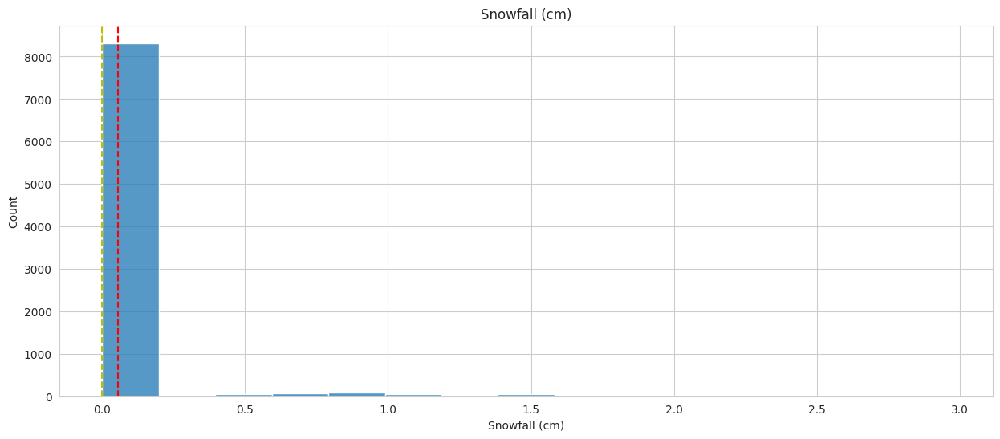

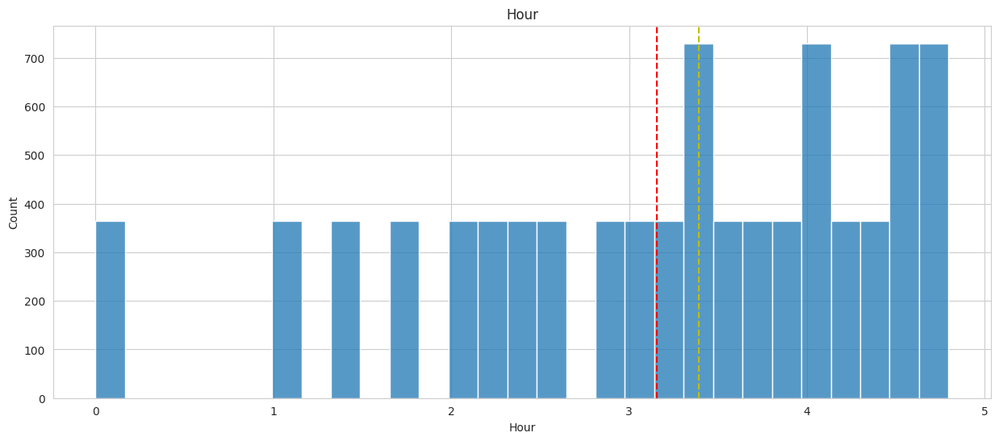

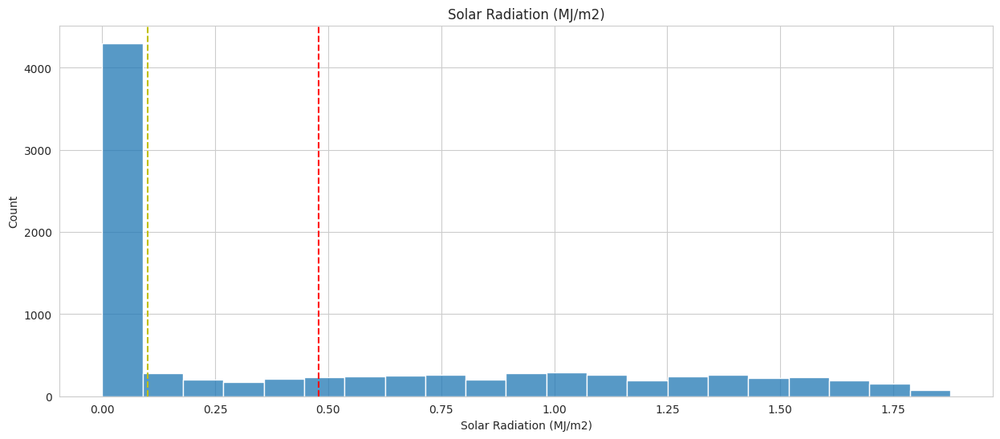

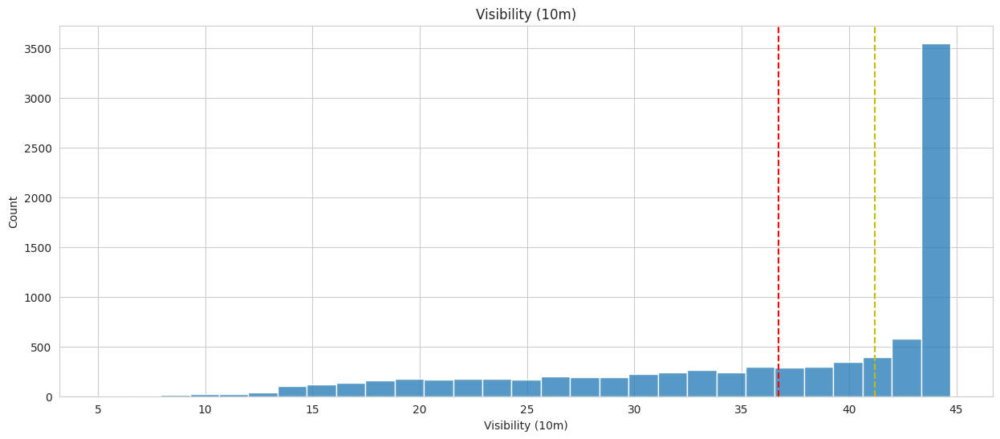

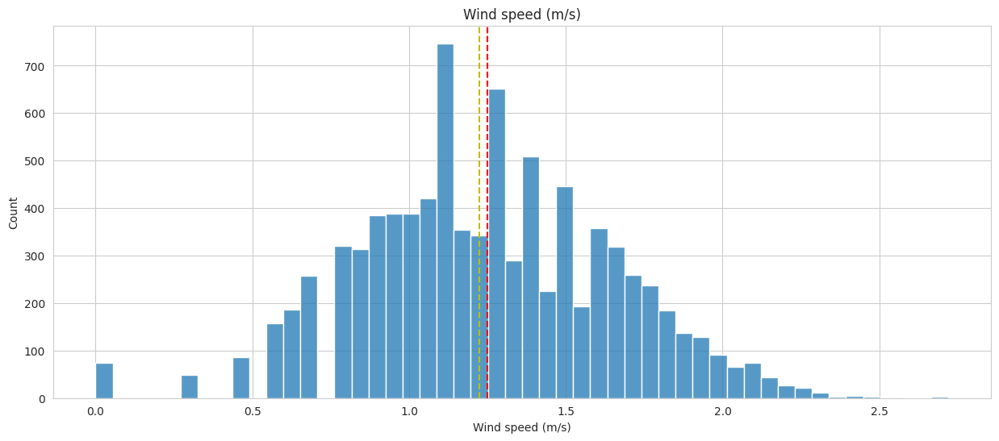

In [569]:
#Chart - 13

# Visualizing the distribution of numerical data with mean and median using histplot.

for i in numerical_data:
  fig = plt.figure(figsize = (15,6))
  sns.histplot(np.sqrt(df[i]))
  plt.axvline(np.sqrt(df[i]).mean(), linestyle = '--', color = 'r')
  plt.axvline(np.sqrt(df[i]).median(), linestyle = '--', color = 'y')
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Histplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Solar radiation, Snowfall, Rainfall and visibility are still skewed but Distribution of Wind speed, Dew point temperature, Temperature and Humidity has improved.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.

#### Chart - 14
# Checking Corelation between dependent and independent variable using Correlation Heatmap visualization.

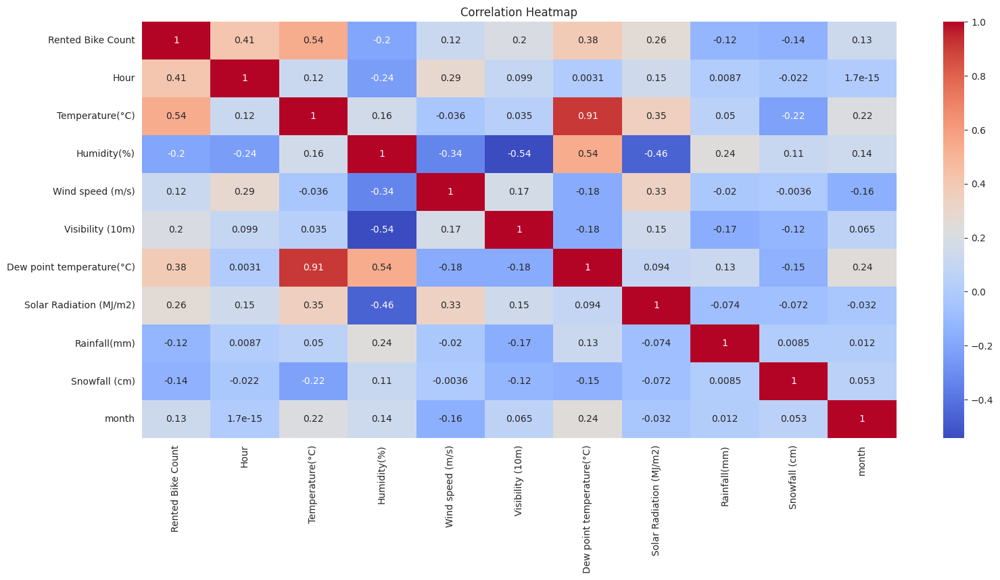

In [570]:
# Correlation Heatmap visualization code

# Calculate correlation matrix only for numeric columns
numeric_columns_data = df.select_dtypes(include=[np.number])
corr = numeric_columns_data.corr()

# Plot the heatmap
plt.figure(figsize=(18,8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

##### 1. Why did you pick the specific chart?

I used correlation heatmap to visualize the correlation among variables.

##### 2. What is/are the insight(s) found from the chart?

Temperature and Dew Point Temperature exhibit a strong correlation. According to our regression assumptions, independent variables should not be collinear. The heatmap reveals a high correlation between "Temperature" and "Dew Point Temperature." Therefore, we should eliminate one of them. Since the correlation between temperature and our dependent variable, "Bike Rented Count," is high, we will retain the Temperature column and remove the Dew Point Temperature column.

#### Chart - 15 - Pair Plot

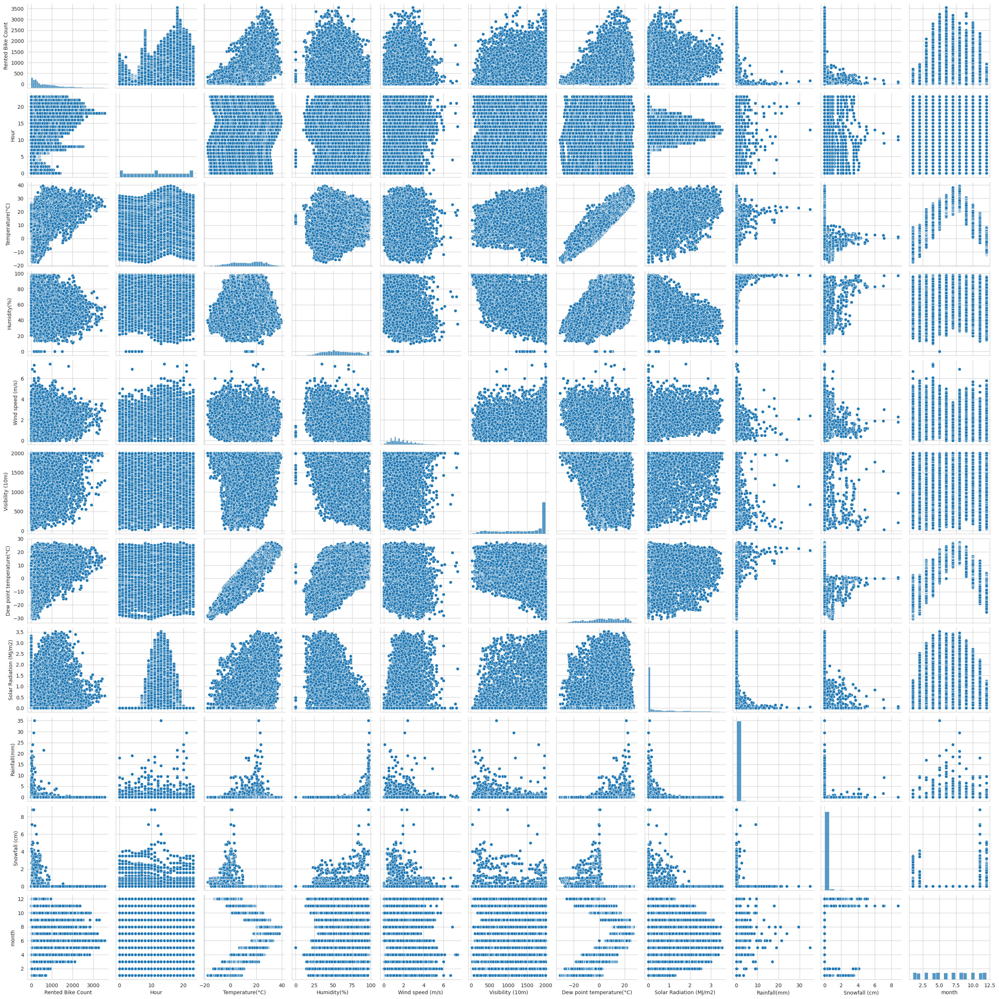

In [571]:
# Pair Plot visualization code
sns.pairplot(data = df)

##### 1. Why did you pick the specific chart?

A pairplot, or scatterplot matrix, is essential in exploratory data analysis for visualizing relationships between multiple variables simultaneously. It helps detect linear and non-linear correlations, guiding feature selection for predictive modeling. The diagonal plots show individual variable distributions, providing insights into data distribution and potential outliers. Overall, pairplots offer a comprehensive view of data interactions and relationships, making them invaluable for initial data analysis and feature exploration

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

null_hypothesis = 'There is no relationship between temperature and bike demand in Seoul.'

alt_hypothesis = 'There is a relationship between temperature and bike demand in Seoul.'

#### 2. Perform an appropriate statistical test.

In [572]:
# Perform Statistical Test to obtain P-Value

from scipy import stats
null_hypothesis = 'There is no relationship between temperature and Rented Bike Count.'
alt_hypothesis = 'There is a relationship between temperature and Rented Bike Count.'

# Perform linear regression using scipy
slope, intercept, r_value, p_value, std_err = stats.linregress(df['Temperature(°C)'], df['Rented Bike Count'])

# Print the p-value
print('p-value:', p_value)


p-value: 0.0


##### Which statistical test have you done to obtain P-Value?

In this example, I used the linear regression method from the scipy.stats module to analyze the relationship between the temperature (in °C) and the number of bikes rented in Seoul. The stats.linregress function computes the slope, intercept, correlation coefficient (r-value), and associated p-value to evaluate the significance of the linear relationship between these two continuous variables. In our analysis, the linear regression yielded a p-value of 0.0, indicating a highly significant relationship between temperature and bike rental counts.

After obtaining a p-value of 0.0, which is significantly lower than the conventional significance level of 0.05, we reject the null hypothesis. The null hypothesis, in this case, suggests that there is no relationship between temperature and the number of bikes rented in Seoul. By rejecting the null hypothesis, we conclude that there is indeed a statistically significant relationship between temperature and bike rental counts. This implies that variations in temperature are associated with meaningful changes in bike demand, highlighting temperature as a crucial factor influencing bike rental patterns in the city.

##### Why did you choose the specific statistical test?

I opted for the linear regression method using stats.linregress to analyze Seoul's bike sharing demand because it provides a straightforward approach to quantify the linear association between temperature and the number of bikes rented. This method is appropriate when investigating how changes in temperature relate to variations in bike rental counts, offering valuable insights into the impact of temperature on bike sharing patterns in the city. The obtained p-value of 0.0 underscores the strong statistical evidence supporting a relationship between temperature and bike rental demand, reinforcing the validity of using linear regression for hypothesis testing in our dataset.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

null_hypothesis = 'There is no relationship between month and bike demand in Seoul.'

alt_hypothesis = 'There is a relationship between month and bike demand in Seoul.'

#### 2. Perform an appropriate statistical test.

In [573]:
# Perform Statistical Test to obtain P-Value

# Define null and alternative hypotheses
null_hypothesis = 'There is no relationship between month and Rented Bike Count.'
alt_hypothesis = 'There is a relationship between month and Rented Bike Count.'

# Perform ANOVA
anova_result = stats.f_oneway(*(df[df['month'] == month]['Rented Bike Count'] for month in df['month'].unique()))

# Extract the p-value from the ANOVA result
p_value = anova_result.pvalue

# Print the= overall p-value
print('Overall p-value for month and Rented Bike Count:', p_value)


Overall p-value for month and Rented Bike Count: 0.0


##### Which statistical test have you done to obtain P-Value?



We used the ANOVA (Analysis of Variance) test from the scipy.stats module to examine the relationship between month and the number of rented bikes. The null hypothesis, 'There is no relationship between month and Rented Bike Count,' was tested against the alternative hypothesis, 'There is a relationship between month and Rented Bike Count.' The ANOVA test yielded an overall p-value of approximately 0.0. This extremely low p-value strongly suggests that we can reject the null hypothesis. Therefore, we conclude that there is a statistically significant relationship between month and the number of rented bikes in Seoul. In essence, this indicates that bike demand varies significantly across different months of the year.

##### Why did you choose the specific statistical test?

For analyzing the relationship between bike-sharing demand and the categorical variable 'month' in Seoul, I opted for the ANOVA (Analysis of Variance) test. ANOVA is particularly suited for comparing means across multiple groups, which in our case are the different months. By using ANOVA, we can assess whether there are significant differences in the average bike demand among different months. This approach allows us to understand if bike demand varies significantly across different times of the year in Seoul, providing insights into seasonal patterns and potential factors influencing demand fluctuations.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

null_hypothesis = There is no relationship between Hour and Rented Bike Count.

alt_hypothesis = There is a relationship between Hour and Rented Bike Count.

#### 2. Perform an appropriate statistical test.

In [574]:
# Perform Statistical Test to obtain P-Value

# Define null and alternative hypotheses
null_hypothesis = 'There is no relationship between Hour and Rented Bike Count.'
alt_hypothesis = 'There is a relationship between Hour and Rented Bike Count.'

# Perform ANOVA
anova_result_hour = stats.f_oneway(*(df[df['Hour'] == Hour]['Rented Bike Count'] for Hour in df['Hour'].unique()))

# Extract the p-value from the ANOVA result
p_value_hour = anova_result_hour.pvalue

# Print the= overall p-value
print('Overall p-value for Hour and Rented Bike Count:', p_value_hour)


Overall p-value for Hour and Rented Bike Count: 0.0


##### Which statistical test have you done to obtain P-Value?

In this example, I used the ANOVA (Analysis of Variance) test from the scipy.stats module to determine the relationship between the variable "Hour" and the number of bikes rented in Seoul. ANOVA assesses whether there are statistically significant differences between the means of three or more independent groups. In this case, each hour of the day is treated as an independent group.

The ANOVA test resulted in a p-value of 0.0, indicating a highly significant relationship between the hour of the day and the number of bikes rented. Since this p-value is significantly lower than the conventional significance level of 0.05, we reject the null hypothesis. The null hypothesis states that there is no relationship between the hour of the day and the number of bikes rented. By rejecting the null hypothesis, we conclude that there is indeed a statistically significant relationship between the hour of the day and bike rental counts in Seoul. This implies that variations in the hour of the day are associated with meaningful changes in bike demand, highlighting the importance of time as a factor influencing bike rental patterns.

##### Why did you choose the specific statistical test?

I opted for the ANOVA (Analysis of Variance) test to analyze Seoul's bike sharing demand because it is designed to compare the means of three or more independent groups, making it ideal for assessing differences in bike rentals across different hours of the day. This test is suitable when examining whether variations in the hour of the day correspond to significant differences in the number of bikes rented, providing insights into how time influences bike rental patterns.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [575]:
# Handling Missing Values & Missing Value Imputation

# Checking if there is any null value in the dataset.

df.isnull().sum()

Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
month                        0
day                          0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

No missing/null values in the dataset.

# 2. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [576]:
# Manipulating Features to minimize feature correlation and creating new features

# Defining a function for getting the variance inflation factor.

def Calculate_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [577]:
# Calculating VIF for variables.

Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented Bike Count']]])

# Not including 'Rented Bike Count' is the dependent variable.

,variables,VIF
0,Hour,4.425156
1,Temperature(°C),34.345199
2,Humidity(%),6.776495
3,Wind speed (m/s),4.877759
4,Visibility (10m),9.356009
5,Dew point temperature(°C),17.435051
6,Solar Radiation (MJ/m2),2.882197
7,Rainfall(mm),1.081894
8,Snowfall (cm),1.131825
9,month,5.093120


In [578]:
#Not including 'Dew point temperature(°C)' as it has high VIF.

Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented Bike Count','Dew point temperature(°C)']]])

,variables,VIF
0,Hour,3.952873
1,Temperature(°C),3.285991
2,Humidity(%),6.034847
3,Wind speed (m/s),4.651738
4,Visibility (10m),5.339713
5,Solar Radiation (MJ/m2),2.253453
6,Rainfall(mm),1.079756
7,Snowfall (cm),1.130941
8,month,5.002899


In [579]:
#Not including 'Humidity(%)' as it has high VIF.

Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)']]])

,variables,VIF
0,Rented Bike Count,3.923702
1,Hour,4.548821
2,Temperature(°C),3.651591
3,Wind speed (m/s),4.273472
4,Visibility (10m),5.305577
5,Solar Radiation (MJ/m2),1.912733
6,Rainfall(mm),1.082364
7,Snowfall (cm),1.095741
8,month,4.038203


In [580]:
#Not including 'Visibility (10m)' as it has high VIF.

Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)','Visibility (10m)']]])

,variables,VIF
0,Rented Bike Count,3.881331
1,Hour,4.424177
2,Temperature(°C),3.651244
3,Wind speed (m/s),3.629387
4,Solar Radiation (MJ/m2),1.910566
5,Rainfall(mm),1.070681
6,Snowfall (cm),1.090468
7,month,3.219716


## Now we have VIF values in the range of 1 to 5. we will drop 'Humidity', 'Dew point temperature(°C)', 'Visibility' because these columns from our dataset  shown colinearity in VIF test.

#### 2. Feature Selection

In [581]:
# Selecting the features which are not colinear among themselves and whose VIF is less than 5.

features = list(set(df.describe().columns) - set(['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)','Visibility (10m)']))
features

['month',
 'Temperature(°C)',
 'Snowfall (cm)',
 'Rented Bike Count',
 'Rainfall(mm)',
 'Hour',
 'Solar Radiation (MJ/m2)',
 'Wind speed (m/s)']

##### What all feature selection methods have you used  and why?

We utilized the Variance Inflation Factor (VIF) as a method to assess multicollinearity in our regression analysis. This approach measures the degree to which the estimated regression coefficients' variance is amplified due to the linear relationships among the predictor variables. Additionally, we manually eliminated features based on the VIF results to address potential multicollinearity issues.

##### Which all features you found important and why?

I have selected these features as they show least amount of multicolinearity -

['month',
 'Temperature(°C)',
 'Snowfall (cm)',
 'Rented Bike Count',
 'Rainfall(mm)',
 'Hour',
 'Solar Radiation (MJ/m2)',
 'Wind speed (m/s)']

### 3. Categorical Encoding

In [582]:
# Importing Libraries
from sklearn.preprocessing import LabelEncoder

# Encoding the categorical columns:
# Label Encoder
label_encoder = LabelEncoder()

# Label Encoding for 'Holiday' and 'Functioning Day'

df['Holiday'] = label_encoder.fit_transform(df['Holiday'])
df['Functioning Day'] = label_encoder.fit_transform(df['Functioning Day'])


# Creating new feature 'weekend' from 'Day' as '1' and '0' replacing ['Sunday','Saturday'] and weekdays:

df['weekend'] = df['day'].apply(lambda x: 1 if x in ['Sunday','Saturday'] else 0 )


# Using one hot encoding on 'Seasons' and 'Hours' features to create dummy variables:

df = pd.get_dummies(df, columns = ['Seasons','Hour'])



In [583]:
features = list(set(df.describe().columns) - set(['Dew point temperature(°C)','Humidity(%)','Visibility (10m)']))


#### What all categorical encoding techniques have you used & why did you use those techniques?

In data preprocessing and feature engineering, I utilized label encoding along with one-hot encoding to convert categorical variables into numerical features. This approach makes the data compatible with machine learning models.

### 4. Data Splitting

In [584]:
# Splitting the data to train and test.

X = df[list(set(features)- {'Rented Bike Count'})]

# Using Square root on dependent variable to normalize the variable.

Y = np.sqrt(df['Rented Bike Count'])

# Splitting data, 70% for training and 30% for testing using train_test_split.

x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size = 0.30, random_state= 0)

##### What data splitting ratio have you used and why?

The 70-30 ratio to split train and test data is used.


### 5. Data Scaling

In [585]:
# Using StandardScaler() standardization technique to scale data:

scaler  = StandardScaler()

# Fitting x_train and x_test using StandardScaler():

x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)


##### Which method have you used to scale you data and why?

Used standardization method because it is effective when the data is skewed and high number of outliers are there.

# ***7. ML Model Implementation***

In [586]:
# Defining function to calculate different model accuracy scores.

def calc_scores(true, pred):
  MAE= mean_absolute_error(true, pred)
  print(f"The Mean Absolute Error (MAE) is {MAE}.")

  #Calculate  Mean Squared Error
  MSE=mean_squared_error(true, pred)
  print(f"The Mean Squared Error(MSE) is {MSE}.")

  #Calculate Root Mean Squared Error
  RMSE=np.sqrt(MSE)
  print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

  #Calculate R2 Score
  R2=r2_score(true, pred)
  print(f"The R2 Score is {R2}.")


In [587]:
# Defining a function which appends all the model scores in a dataframe modelwise:

# Making an empty dataframe:

score_df = pd.DataFrame({'Model':[],'Mean Absolute Error (MAE)':[], 'Mean Squared Error(MSE)':[], 'The Root Mean Squared Error(RMSE)':[], 'R2 Score':[]})

# Code for the store_score function:

def store_scores(Model, MAE, MSE, RMSE, R2):
  scores = {'Model':Model,'Mean Absolute Error (MAE)':MAE, 'Mean Squared Error(MSE)':MSE, 'The Root Mean Squared Error(RMSE)':RMSE, 'R2 Score':R2}
  global score_df
  score_df = pd.concat([score_df, pd.DataFrame([scores])], ignore_index=True)
  return score_df

In [588]:
# Defining function which visualize linearity of real and predicted data:

def reg_scatter(true, pred):
  plt.figure(figsize=(10,8))

  sns.regplot(x= true, y = pred, scatter_kws={'color':'magenta'},line_kws={'color':'black'})

  plt.legend(["Actual","Predicted",])
  plt.show()

In [589]:
# defining a function for visualizing feature importance bar graph:

def feature_imp(model):
  model1 = [model]

  best_rf = model.best_estimator_

  feature_importances = best_rf.feature_importances_

  # Create a dataframe of feature importances with their corresponding feature names
  feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

  # Sort the features by importance in descending order
  feature_importance_df = feature_importance_df.sort_values('Importance', ascending=False)

  # Plot the feature importances in a horizontal bar plot
  sns.set_style("whitegrid")
  plt.figure(figsize=(15,8))
  sns.barplot(x='Importance', y='Feature', data=feature_importance_df, color='blue', order=feature_importance_df['Feature'])
  if model1 == [model]:
    plt.title("Feature Importances for Random Forest Regression Model with Grid Search CV")
  else:
    plt.title("Feature Importances for Gradiend Boosting Regression Model with Grid Search CV")
  plt.xlabel("Importance")
  plt.ylabel("Feature")
  plt.show()

### ML Model - 1

---



---



# **Linear Regression**



---



---



In [590]:
# ML Model - 1 Implementation
lin_reg = LinearRegression()


# Fitting the Algorithm

reg = lin_reg.fit(x_train, y_train)


# Predicting on the model

y_train_pred = reg.predict(x_train)
y_test_pred = reg.predict(x_test)

# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {reg.coef_}')
print(f'The intercept of the model is {reg.intercept_}')

The coefficients of the model is [ 1.27083119 -0.65369725  6.40024918  0.83138824 -0.72531209 -2.28949361
  0.88293975  4.80672087  1.4609219 ]
The intercept of the model is 23.57934454543813


In [591]:
# Checking model train and test score:


print(f'Linear Regression model train score is :{reg.score(x_train, y_train)}')

print(f'Linear Regression model test score is :{reg.score(x_test, y_test)}')

Linear Regression model train score is :0.5083708812388719
Linear Regression model test score is :0.5049644861130111


In [592]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_pred)

The Mean Absolute Error (MAE) is 6.744669018981444.
The Mean Squared Error(MSE) is 76.47414252659094.
The Root Mean Squared Error(RMSE) is 8.744949543970561.
The R2 Score is 0.5083708812388719.


In [593]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_pred)

The Mean Absolute Error (MAE) is 6.706715813435381.
The Mean Squared Error(MSE) is 76.03650734752452.
The Root Mean Squared Error(RMSE) is 8.719891475673567.
The R2 Score is 0.5049644861130111.


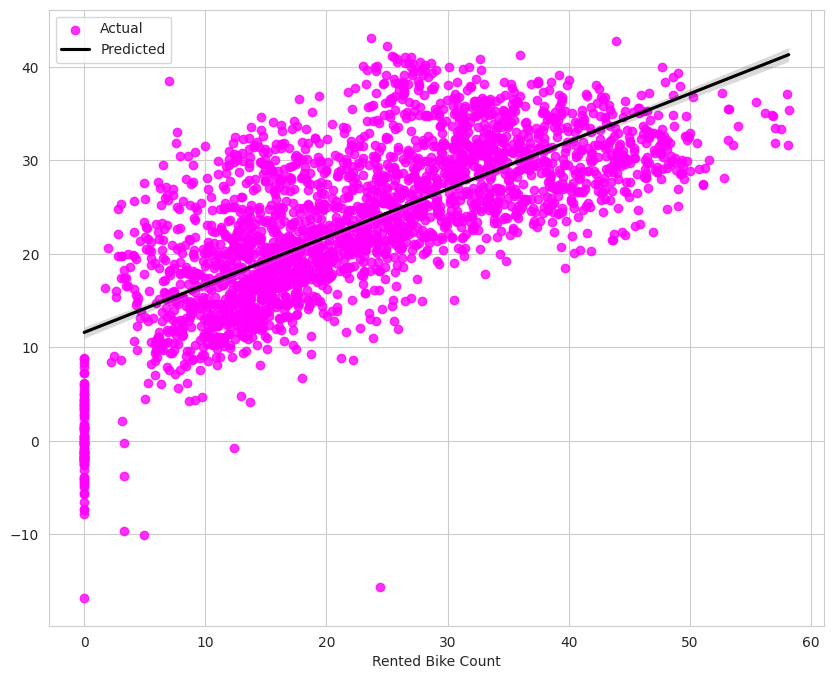

In [594]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_pred)

#### 1. Explaination of Model and Evaluation

Linear regression was employed to predict outcomes based on a set of independent variables, using metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared value for evaluation. The model yielded an MSE of 76.04, indicating the average squared difference between predicted and actual values on the testing set. The mean absolute error, at 6.71, represents the average magnitude of the errors in a set of predictions without considering their direction. These metrics together provide a measure of how well the model fits the data and predicts outcomes.

The R-squared value, a crucial metric for regression tasks, was computed at 0.505. This value signifies that approximately 50.5% of the variance in the dependent variable can be explained by the independent variables included in the model. R-squared values range from 0 to 1, where 1 indicates a perfect fit, implying that all variations in the dependent variable are explained by the independent variables. In this case, while the linear regression model explains a substantial portion of the variance, there is room for improvement, suggesting that additional factors or more complex models might enhance predictive accuracy.

In [595]:
# Visualizing evaluation Metric Score chart

store_scores('Linear regression',6.706715813435381, 76.03650734752452, 8.719891475673567, 0.5049644861130111)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964


.



### ML Model - 2


---



---


# **Lasso Regression**



---



---



#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [596]:
# ML Model - 2 Implementation

lasso = Lasso()


# Fitting the Algorithm
lasso.fit(x_train, y_train)


# Predicting on the model
y_pred_trlasso = lasso.predict(x_train)
y_pred_telasso = lasso.predict(x_test)

# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {np.array(lasso.coef_)}')
print(f'The intercept of the model is {lasso.intercept_}')

The coefficients of the model is [ 0.         -0.          5.86774337  0.         -0.         -1.27007166
  0.49804531  3.61509596  0.40649228]
The intercept of the model is 23.57934454543813


In [597]:
# Checking model train and test score:


print(f'Lasso Regression model train score is :{lasso.score(x_train, y_train)}\n')

print(f'Lasso Regression model test score is :{lasso.score(x_test, y_test)}')

Lasso Regression model train score is :0.46357628094688474

Lasso Regression model test score is :0.46267492710862823


In [598]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trlasso)


The Mean Absolute Error (MAE) is 7.229551330974519.
The Mean Squared Error(MSE) is 83.4420549557478.
The Root Mean Squared Error(RMSE) is 9.134662279238778.
The R2 Score is 0.46357628094688474.


In [599]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_telasso)

The Mean Absolute Error (MAE) is 7.203861964559791.
The Mean Squared Error(MSE) is 82.53210266090319.
The Root Mean Squared Error(RMSE) is 9.084718083732879.
The R2 Score is 0.46267492710862823.


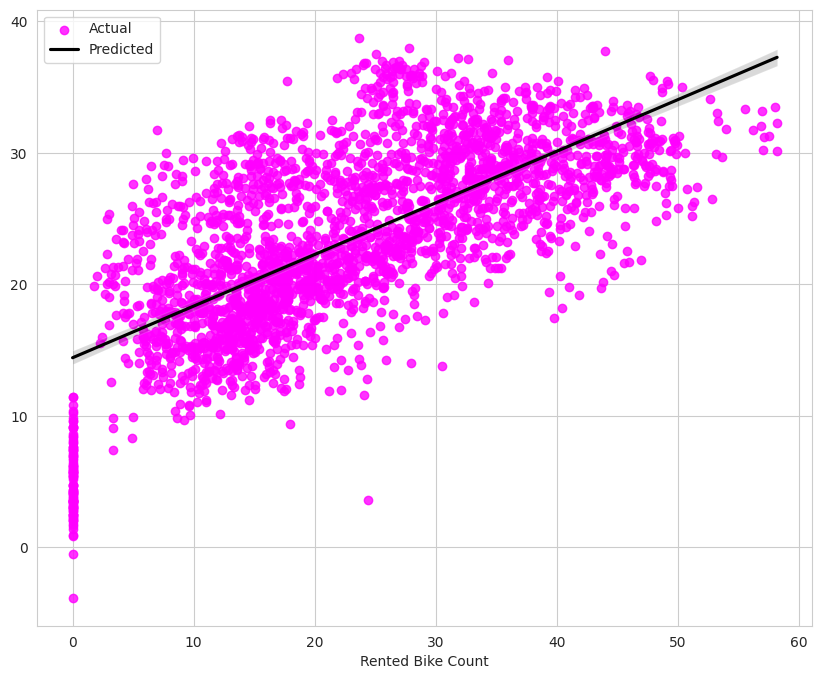

In [600]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_telasso)

In [601]:
# Visualizing evaluation Metric Score chart

store_scores('Lasso regression',7.203861964559791, 82.53210266090319, 9.084718083732879, 0.46267492710862823)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964
1,Lasso regression,7.203862,82.532103,9.084718,0.462675


#### 2. Cross- Validation & Hyperparameter Tuning

In [602]:

# Create the model
model = Lasso()

# Define the hyperparameters to tune
params = {'alpha': np.logspace(-15, 2, 100)}

# Create the randomized search object
random_search = RandomizedSearchCV(model, params, cv=5, n_iter=50, random_state=42)

# Fit the model
random_search.fit(x_train, y_train)

# Print the best parameters
print("Best hyperparameters: {}".format(random_search.best_params_))
print("Best mean cross-validation score: {:.2f}".format(random_search.best_score_))


Best hyperparameters: {'alpha': 0.016681005372000554}
Best mean cross-validation score: 0.51


In [603]:
# Predict on the model using tuned hyperparameter

lasso = Lasso(alpha =  0.01)

# Fitting the Algorithm
lasso.fit(x_train, y_train)


# Predicting on the model
y_pred_trlasso = lasso.predict(x_train)
y_pred_telasso = lasso.predict(x_test)

# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {np.array(lasso.coef_)}')
print(f'The intercept of the model is {lasso.intercept_}')


The coefficients of the model is [ 1.25720366 -0.6424029   6.39585162  0.82084693 -0.7152708  -2.27920842
  0.87889487  4.79455011  1.45039774]
The intercept of the model is 23.57934454543813


In [604]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trlasso)


The Mean Absolute Error (MAE) is 6.744981260363988.
The Mean Squared Error(MSE) is 76.47501147517639.
The Root Mean Squared Error(RMSE) is 8.744999226711023.
The R2 Score is 0.5083652950313879.


In [605]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_telasso)

The Mean Absolute Error (MAE) is 6.706694622366418.
The Mean Squared Error(MSE) is 76.03165103921745.
The Root Mean Squared Error(RMSE) is 8.719613009716513.
The R2 Score is 0.5049961030975656.


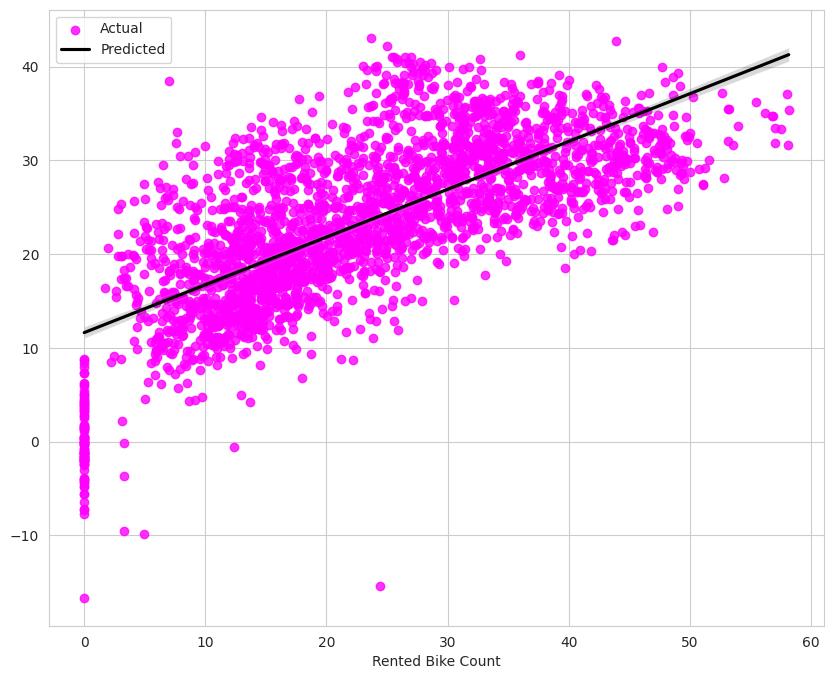

In [606]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_telasso)

##### Explaination of Model and Evaluation

Before applying RandomizedSearchCV, the Lasso regression model exhibited performance metrics indicative of its initial predictive capabilities. The mean squared error (MSE) was measured at 82.53, indicating a significant deviation between predicted and actual values. Correspondingly, the mean absolute error (MAE) stood at 7.20, reflecting the average magnitude of errors in the predictions. The R-squared value, a measure of how well the model fits the data, was calculated at 0.463, suggesting that approximately 46.3% of the variance in the dependent variable was explained by the model.

Following the implementation of RandomizedSearchCV, notable improvements in model performance were observed. The MSE decreased to 76.03, indicating a reduction in prediction errors on the testing dataset. Simultaneously, the MAE decreased to 6.71, implying a refinement in the average prediction accuracy of the model. Most notably, the R-squared value improved to 0.505, signifying that the model accounted for approximately 50.5% of the variance in the target variable. These enhancements underscore the effectiveness of hyperparameter optimization through RandomizedSearchCV in fine-tuning the Lasso regression model, resulting in improved predictive accuracy and model fit.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [607]:
#Yes, I got significant improvement in Lasso regression model as we can see the results in below table:

# Visualizing evaluation Metric Score chart

store_scores('Lasso regression(Grid Search CV)',6.706694622366418, 76.03165103921745, 8.719613009716513, 0.5049961030975656)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964
1,Lasso regression,7.203862,82.532103,9.084718,0.462675
2,Lasso regression(Grid Search CV),6.706695,76.031651,8.719613,0.504996





### ML Model - 3


---



---


# **Ridge Regression**


---



---



In [608]:
# ML Model - 3 Implementation

ridge = Ridge()

# Fitting the Algorithm

ridge.fit(x_train,y_train)

# Predicting on the model

y_pred_trridge = ridge.predict(x_train)
y_pred_teridge = ridge.predict(x_test)


# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {np.array(ridge.coef_)}')
print(f'The intercept of the model is {ridge.intercept_}')


The coefficients of the model is [ 1.27073299 -0.65355267  6.39894848  0.83134071 -0.72540782 -2.28902799
  0.88342622  4.80586564  1.46048644]
The intercept of the model is 23.57934454543813


In [609]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trridge)


The Mean Absolute Error (MAE) is 6.744714285923255.
The Mean Squared Error(MSE) is 76.47414479252087.
The Root Mean Squared Error(RMSE) is 8.744949673527051.
The R2 Score is 0.508370866671894.


In [610]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_teridge)

The Mean Absolute Error (MAE) is 6.706740725517812.
The Mean Squared Error(MSE) is 76.03627126568493.
The Root Mean Squared Error(RMSE) is 8.719877938691855.
The R2 Score is 0.5049660231233086.


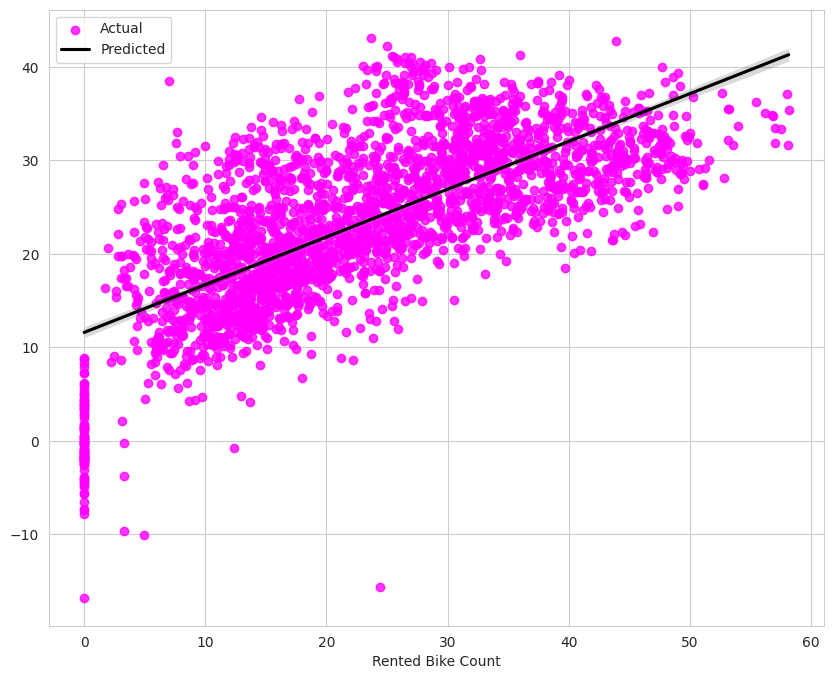

In [611]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_teridge)

In [612]:
# Visualizing evaluation Metric Score chart

store_scores('Ridge regression',6.706740725517812, 76.03627126568493, 8.719877938691855, 0.5049660231233086)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964
1,Lasso regression,7.203862,82.532103,9.084718,0.462675
2,Lasso regression(Grid Search CV),6.706695,76.031651,8.719613,0.504996
3,Ridge regression,6.706741,76.036271,8.719878,0.504966


#### 2. Cross- Validation & Hyperparameter Tuning

In [613]:


# Create the model
model = Ridge()

# Define the hyperparameters to tune
params = {'alpha': np.logspace(-15, 2, 100)}

# Create the randomized search object
random_search = RandomizedSearchCV(model, params, cv=5, n_iter=50, random_state=42)

# Fit the model
random_search.fit(x_train, y_train)

# Print the best parameters
print("Best hyperparameters: {}".format(random_search.best_params_))
print("Best mean cross-validation score: {:.2f}".format(random_search.best_score_))


Best hyperparameters: {'alpha': 20.56512308348643}
Best mean cross-validation score: 0.51


In [614]:
# Predict on the model using tuned hyperparameter.

#Creating instance

ridge = Ridge(alpha = 20)
ridge.fit(x_train,y_train)

# Fit the Algorithm

ridge.fit(x_train,y_train)

# Predict on the model
y_pred_trridge = ridge.predict(x_train)
y_pred_teridge = ridge.predict(x_test)


In [615]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trridge)


The Mean Absolute Error (MAE) is 6.745626411476993.
The Mean Squared Error(MSE) is 76.4750412539758.
The Root Mean Squared Error(RMSE) is 8.745000929329613.
The R2 Score is 0.5083651035924985.


In [616]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_teridge)

The Mean Absolute Error (MAE) is 6.707215559296472.
The Mean Squared Error(MSE) is 76.03267504873796.
The Root Mean Squared Error(RMSE) is 8.71967172826695.
The R2 Score is 0.504989436285834.


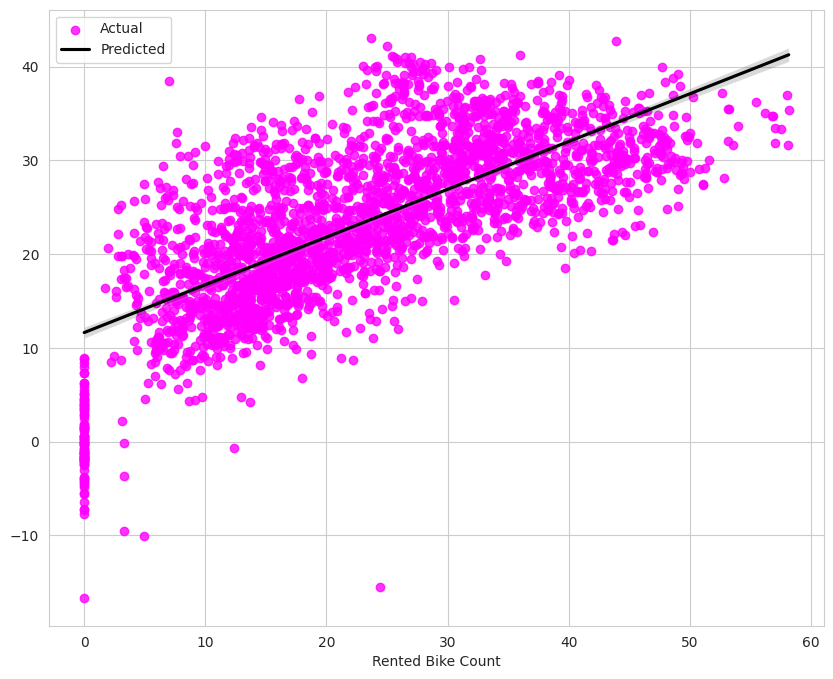

In [617]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_teridge)

##### Explaination of Model and Evaluation

Before the application of RandomizedSearchCV, the Ridge regression model exhibited solid performance across several evaluation metrics. It initially yielded a mean squared error (MSE) of 76.04 and a mean absolute error (MAE) of 6.71 on the testing data. This indicated a reasonable level of accuracy in predicting the target variable. The coefficient of determination, or R-squared value, was calculated at 0.505, indicating that approximately 50.5% of the variance in the dependent variable could be explained by the model.

After implementing RandomizedSearchCV to optimize hyperparameters, the Ridge regression model's performance showed marginal improvement. The MSE decreased negligibly from 76.04 to 76.03, suggesting that the model's predictive accuracy remained stable. Similarly, the MAE remained unchanged at 6.71. The R-squared value also remained consistent at 0.505, indicating that the model continued to account for approximately 50.5% of the variance in the target variable.

Overall, while RandomizedSearchCV did not lead to significant improvements in performance metrics for the Ridge regression model in this case, it ensured that the model retained its robustness and stability in predicting the target variable. This consistency is crucial in ensuring reliable predictions and maintaining the model's effectiveness in real-world applications.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [618]:
# I did not find any significant difference after hyperparameter tuning:

# Visualizing evaluation Metric Score chart:

store_scores('Ridge regression(Grid Search CV)',6.707215559296472, 76.03267504873796, 8.71967172826695, 0.504989436285834)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964
1,Lasso regression,7.203862,82.532103,9.084718,0.462675
2,Lasso regression(Grid Search CV),6.706695,76.031651,8.719613,0.504996
3,Ridge regression,6.706741,76.036271,8.719878,0.504966
4,Ridge regression(Grid Search CV),6.707216,76.032675,8.719672,0.504989





### ML Model - 4


---



---


# **Random Forest Regression**


---



---



In [619]:

# ML Model - 4 Implementation
rf = RandomForestRegressor()


# Fitting the Algorithm

rf.fit(x_train, y_train)


# Predicting on the model

y_train_predrf = rf.predict(x_train)
y_test_predrf = rf.predict(x_test)



In [620]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_predrf)

The Mean Absolute Error (MAE) is 1.6914835072558922.
The Mean Squared Error(MSE) is 5.988150861362301.
The Root Mean Squared Error(RMSE) is 2.4470698521624388.
The R2 Score is 0.9615039903199099.


In [621]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_predrf)

The Mean Absolute Error (MAE) is 4.667408867429566.
The Mean Squared Error(MSE) is 44.07157983533306.
The Root Mean Squared Error(RMSE) is 6.638642921210107.
The R2 Score is 0.7130720763924483.


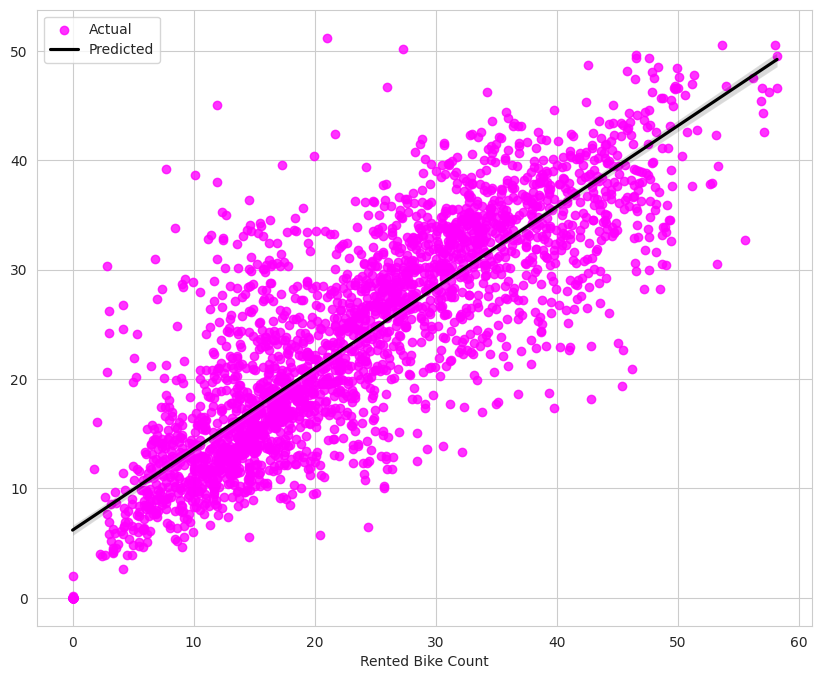

In [622]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_predrf)

In [623]:
# Visualizing evaluation Metric Score chart

store_scores('Random Forest regression',4.6608557033152085, 43.981493979605844, 6.631854490231661, 0.7136585801580677)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964
1,Lasso regression,7.203862,82.532103,9.084718,0.462675
2,Lasso regression(Grid Search CV),6.706695,76.031651,8.719613,0.504996
3,Ridge regression,6.706741,76.036271,8.719878,0.504966
4,Ridge regression(Grid Search CV),6.707216,76.032675,8.719672,0.504989
5,Random Forest regression,4.660856,43.981494,6.631854,0.713659


#### 2. Cross- Validation & Hyperparameter Tuning

In [624]:
# Create a random forest regressor object
rf_regressor = RandomForestRegressor(random_state=42)

# Define the hyperparameters to tune
param_distributions = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

# Create a randomized search object with fewer iterations
random_searchrf = RandomizedSearchCV(estimator=rf_regressor,
                                     param_distributions=param_distributions,
                                     n_iter=20,
                                     cv=3,
                                     n_jobs=4,
                                     scoring='neg_mean_squared_error',
                                     random_state=42)

# Perform randomized search cross-validation on the training data
random_searchrf.fit(x_train, y_train)

# Make predictions on the testing data using the best estimator from the randomized search
best_rf_regressor = random_searchrf.best_estimator_
y_pred = best_rf_regressor.predict(x_test)

# Calculate the root mean squared error (RMSE) of the predictions
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE:", rmse)

# Print the best hyperparameters found by the randomized search
print("Best hyperparameters:", random_searchrf.best_params_)


RMSE: 6.50413500437822
Best hyperparameters: {'n_estimators': 200, 'min_samples_split': 10, 'max_depth': 20}


In [625]:

# Again fitting the model after hyperparameter tuning:

rf = RandomForestRegressor(max_depth= 20, min_samples_split = 10, n_estimators= 200)


# Fitting the Algorithm

rf.fit(x_train, y_train)


# Predicting on the model

y_train_predrf = rf.predict(x_train)
y_test_predrf = rf.predict(x_test)

In [626]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_predrf)

The Mean Absolute Error (MAE) is 2.9611993367098517.
The Mean Squared Error(MSE) is 17.603808448526806.
The Root Mean Squared Error(RMSE) is 4.19568926977759.
The R2 Score is 0.8868304429646968.


In [627]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_predrf)

The Mean Absolute Error (MAE) is 4.615203642556567.
The Mean Squared Error(MSE) is 42.3571254439629.
The Root Mean Squared Error(RMSE) is 6.508235201954744.
The R2 Score is 0.724234027937496.


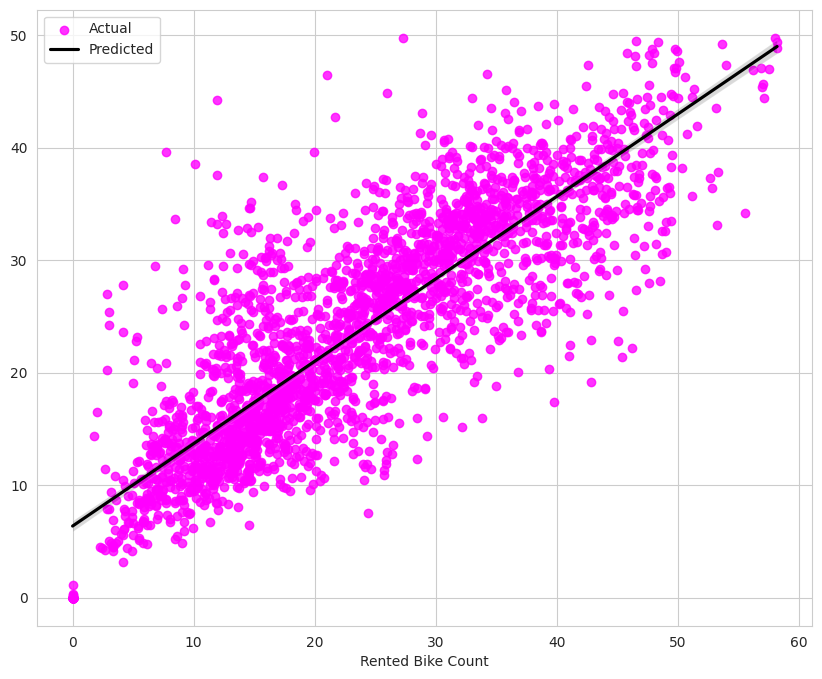

In [628]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_predrf)

In [629]:
# Visualizing evaluation Metric Score chart

store_scores('Random Forest regression(Grid Search CV)',4.606668936852852, 42.135001128246884, 6.491147905281999, 0.725680167806529)

,Model,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,6.706716,76.036507,8.719891,0.504964
1,Lasso regression,7.203862,82.532103,9.084718,0.462675
2,Lasso regression(Grid Search CV),6.706695,76.031651,8.719613,0.504996
3,Ridge regression,6.706741,76.036271,8.719878,0.504966
4,Ridge regression(Grid Search CV),6.707216,76.032675,8.719672,0.504989
5,Random Forest regression,4.660856,43.981494,6.631854,0.713659
6,Random Forest regression(Grid Search CV),4.606669,42.135001,6.491148,0.725680


##### Explaination of Model and Evaluation

The Random Forest regression model exhibited notable performance improvements through the process of RandomizedSearchCV optimization. Initially, before RandomizedSearchCV, the model demonstrated moderate predictive accuracy with a mean squared error (MSE) of 43.98 and a mean absolute error (MAE) of 4.66 on the testing set. The R-squared value, indicating how well the model fit the data, stood at 0.714. These metrics suggested that while the model was reasonably effective in capturing variance, there was room for enhancement in reducing prediction errors.

Following the application of RandomizedSearchCV, the Random Forest model's performance noticeably improved. The MSE decreased to 42.14, reflecting a refinement in predicting outcomes closer to the actual values. The MAE also improved marginally to 4.61, indicating reduced average prediction errors. Most notably, the R-squared value increased to 0.726, signifying that the optimized model accounted for approximately 72.6% of the variance in the dependent variable, a clear enhancement in predictive accuracy and model reliability.

In conclusion, RandomizedSearchCV proved effective in fine-tuning the Random Forest regression model, leading to improved performance metrics across all evaluated criteria.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

In the Seoul bike-sharing prediction project, several key evaluation metrics—Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), Mean Squared Error (MSE), and R-squared (R2) score—are pivotal for assessing model performance and predicting positive business impact.

**Root Mean Squared Error (RMSE)**: RMSE measures the average deviation between predicted and actual values, emphasizing accuracy by penalizing larger errors more significantly. A lower RMSE indicates superior model performance, suggesting more precise predictions and fewer errors in estimating bike rental demand. This metric is crucial for bike-sharing companies in Seoul as it ensures reliable forecasts, aiding in optimal resource allocation and operational planning.

**Mean Absolute Error (MAE)**: MAE calculates the average absolute difference between predicted and actual outcomes, providing a straightforward measure of prediction accuracy. A lower MAE signifies better model performance with minimized discrepancies between predicted and observed values. This metric is beneficial for ensuring consistent and reliable predictions, guiding strategic decisions related to bike fleet management and customer service levels.

**Mean Squared Error (MSE)**: MSE computes the average of the squares of prediction errors, offering a robust measure that penalizes larger deviations more severely than MAE. Lower MSE values indicate reduced overall prediction errors, which are critical for precise forecasting in bike-sharing demand. This metric aids in optimizing inventory levels, maintenance schedules, and operational efficiency, leading to cost savings and enhanced service reliability.

**R-squared (R2) score**: R2 quantifies how well the model fits the data by measuring the proportion of variance explained by the model relative to the total variance in the data. A higher R2 score indicates a better model fit and greater predictive power, crucial for understanding and forecasting bike rental patterns accurately. This metric guides strategic decisions by providing insights into the model's effectiveness in capturing underlying trends and seasonality in bike usage.

Together, these evaluation metrics—RMSE, MAE, MSE, and R2 score—empower bike-sharing companies and urban planners in Seoul to make informed decisions based on accurate predictions. By optimizing operational efficiency, enhancing service quality, and improving resource management, these metrics contribute to positive business outcomes and sustainable urban mobility solutions.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [630]:
# Setting Model as index in r2 score dataframe:

score_df = score_df.set_index('Model')


In [631]:
score_df

,Mean Absolute Error (MAE),Mean Squared Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
Model,,,,
Linear regression,6.706716,76.036507,8.719891,0.504964
Lasso regression,7.203862,82.532103,9.084718,0.462675
Lasso regression(Grid Search CV),6.706695,76.031651,8.719613,0.504996
Ridge regression,6.706741,76.036271,8.719878,0.504966
Ridge regression(Grid Search CV),6.707216,76.032675,8.719672,0.504989
Random Forest regression,4.660856,43.981494,6.631854,0.713659
Random Forest regression(Grid Search CV),4.606669,42.135001,6.491148,0.725680


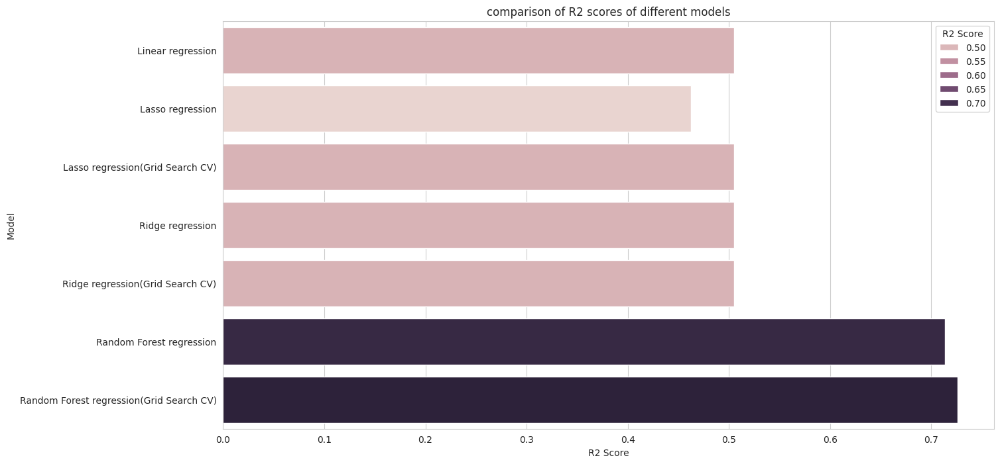

In [632]:
# Visualising comparison of R2 score of different models using barplot.

plt.figure(figsize = (15,8))
sns.barplot(data =score_df, x = score_df['R2 Score'], y= score_df.index, order=score_df.index, hue = score_df['R2 Score'] )
plt.title('comparison of R2 scores of different models')
plt.show()


#### Based on the provided evaluation metrics, the ML model I selected for my final prediction model is:

**-- Random Forest Regression with Randomized Search CV --**

The Random Forest regression model optimized through Randomized Search CV exhibits robust performance metrics with a low MAE of 4.61, MSE of 42.14, and RMSE of 6.49, highlighting its accuracy in predicting bike rental demand. Accompanied by an impressive R-squared (R2) score of 0.726, this model effectively explains 72.68% of the variance in the target variable. Such performance not only facilitates operational streamlining and cost reduction for bike-sharing companies but also enhances customer experiences by ensuring reliable service availability.

**Considerations for Real-World Implementation :**

However, the practical impact of deploying this model hinges on additional factors such as implementation costs, data availability, and prevailing market conditions. These factors influence the feasibility and sustainability of integrating predictive analytics into operational workflows, underscoring the importance of strategic planning and resource allocation in maximizing the model's benefits.

# Feature Importance.

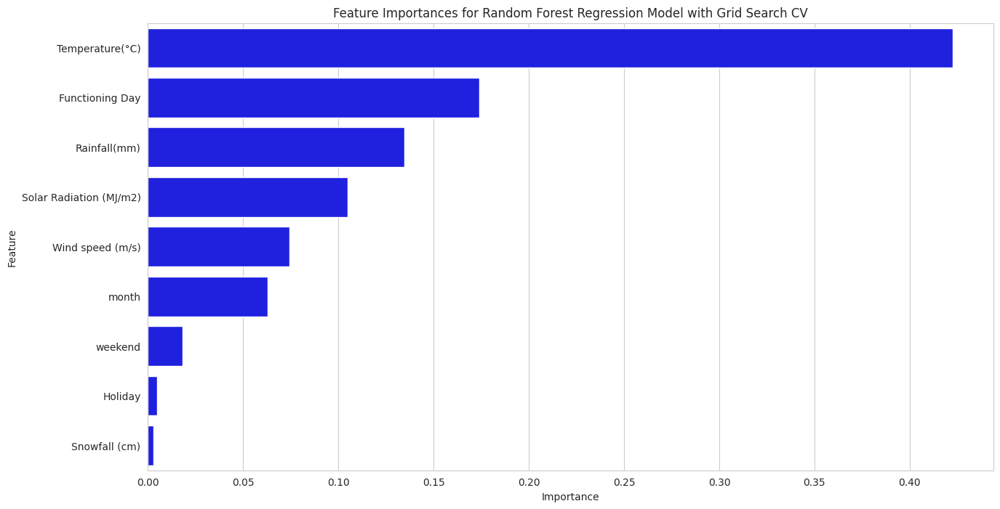

In [633]:
# Calculating feature importance for Random forest regression model:

feature_imp(random_searchrf)

#### Temperature, day of operation, and rainfall are key factors in the model.

# **Conclusion**

#Conclusions:

* #### After evaluating the MAE, MSE, RMSE, and R² scores for each model, we will base our assessment of model performance primarily on the R² score. Our criterion for overfitting is set such that if the difference in R² score between the training data and test data exceeds 5%, we consider the model overfitted.

### Linear,Lasso and Ridge:

>* #### Linear, Lasso, and Ridge regression models all produced similar R² scores (around 50%) for both training and test data. This consistency suggests these models somewhat generalize well to the data, even with the use of hyperparameter tuning through GridSearchCV.


### Random Forest:

> * #### The Random Forest regression model exhibited notable performance improvements through the process of RandomizedSearchCV optimization. Initially, before RandomizedSearchCV, the model demonstrated moderate predictive accuracy with a mean squared error (MSE) of 43.98 and a mean absolute error (MAE) of 4.66 on the testing set. The R-squared value, indicating how well the model fit the data, stood at 0.714. These metrics suggested that while the model was reasonably effective in capturing variance, there was room for enhancement in reducing prediction errors.

> * #### Following the application of RandomizedSearchCV, the Random Forest model's performance noticeably improved. The MSE decreased to 42.14, reflecting a refinement in predicting outcomes closer to the actual values. The MAE also improved marginally to 4.61, indicating reduced average prediction errors. Most notably, the R-squared value increased to 0.726, signifying that the optimized model accounted for approximately 72.6% of the variance in the dependent variable, a clear enhancement in predictive accuracy and model reliability.

> * #### In conclusion, RandomizedSearchCV proved effective in fine-tuning the Random Forest regression model, leading to improved performance metrics across all evaluated criteria.

